<a href="https://colab.research.google.com/github/amavafi/DataScience/blob/main/Proyecto_ParteIII_AnaFiguera.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


#Autonómia Alimentaria 🥑


Este data set muestra el volumen de producción (en toneladas) de alimentos desde el 2000 hasta 2022 para los países de America del norte, sur y central.

Estos alimentos son en su totalidad de origen vegetal y muestran su estructura calórica y cantidad de los macros por cada 100gr del alimento.

Así mismo se ha incluído el volumen de población de cada país.

El objetivo con este informe es estudiar la posibilidad de generar politicas de autosustentabilidad en los requerimientos de consumo de alimentas de la población de cada país. Para ello se plantean las siguentes hipotesis:


*   Es posible auto-sustentar la demanda del consumo de alimentos de origen vegetal?
*   Es posible recomendar y auto-sustentar tipos de alimentos para optimizar el valor nutricional de la población, basado en una dieta de 2000 kCal diarias?

### *Importamos las librerías y los datos*

In [82]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import random
from sklearn.linear_model import LinearRegression

In [83]:
url = "https://raw.githubusercontent.com/amavafi/DataScience/main/DataSetProPo.csv"
df = pd.read_csv(url, sep = ',')
df = df.rename(columns={'M49 Code': 'Code', 'Population(1000)':'Population'})

df

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population
0,32,Argentina,2000,Agriculture,Lupins,120,119,9.88,15.57,2.92,37070774
1,32,Argentina,2000,Agriculture,"Chick peas, dry",1200,378,62.95,20.47,6.04,37070774
2,32,Argentina,2000,Vegetables and Fruit Primary,Papayas,2101,43,10.82,0.47,0.26,37070774
3,32,Argentina,2000,Agriculture,"Chillies and peppers, dry (Capsicum spp., Pime...",3100,324,69.86,10.58,5.81,37070774
4,32,Argentina,2000,Vegetables and Fruit Primary,Pineapples,3150,50,13.12,0.54,0.12,37070774
...,...,...,...,...,...,...,...,...,...,...,...
24003,862,Venezuela (Bolivarian Republic of),2022,"Roots and Tubers, Total",Potatoes,47679648,79,18.07,2.14,0.08,28301696
24004,862,Venezuela (Bolivarian Republic of),2022,"Cereals, primary",Rice,47847263,130,28.17,2.69,0.28,28301696
24005,862,Venezuela (Bolivarian Republic of),2022,Oilcrops Primary,Oil palm fruit,56761536,884,0.00,0.00,100.00,28301696
24006,862,Venezuela (Bolivarian Republic of),2022,"Cereals, primary",Maize (corn),135256845,360,18.70,3.27,1.35,28301696


In [84]:

df.loc[(df['Year'] == 2011) & (df['Country'] == 'Argentina'), 'Population'] = 41520740
df.loc[(df['Year'] == 2001) & (df['Country'] == 'Belize'), 'Population']= 248100
df.loc[(df['Year'] == 2010) & (df['Country'] == 'Bolivia (Plurinational State of)'), 'Population'] = 10223270
df.loc[(df['Year'] == 2022) & (df['Country'] == 'Bolivia (Plurinational State of)'), 'Population'] = 12224110
df.loc[(df['Year'] == 2000) & (df['Country'] == 'Brazil'), 'Population'] = 175873720
df.loc[(df['Year'] == 2014) & (df['Country'] == 'Brazil'), 'Population'] = 203459650
df.loc[(df['Year'] == 2017) & (df['Country'] == 'Brazil'), 'Population'] = 208504960
df.loc[(df['Year'] == 2003) & (df['Country'] == 'Canada'), 'Population'] = 31619450
df.loc[(df['Year'] == 2002) & (df['Country'] == 'Chile'), 'Population'] = 15693790
df.loc[(df['Year'] == 2018) & (df['Country'] == 'Chile'), 'Population'] = 18701450
df.loc[(df['Year'] == 2002) & (df['Country'] == 'Colombia'), 'Population'] = 40454050
df.loc[(df['Year'] == 2005) & (df['Country'] == 'Colombia'), 'Population'] = 42220940
df.loc[(df['Year'] == 2006) & (df['Country'] == 'Colombia'), 'Population'] = 42772910
df.loc[(df['Year'] == 2013) & (df['Country'] == 'Colombia'), 'Population'] = 46237930
df.loc[(df['Year'] == 2003) & (df['Country'] == 'Costa Rica'), 'Population'] = 4188610
df.loc[(df['Year'] == 2004) & (df['Country'] == 'Costa Rica'), 'Population'] = 4252800
df.loc[(df['Year'] == 2019) & (df['Country'] == 'Ecuador'), 'Population'] = 17343740
df.loc[(df['Year'] == 2022) & (df['Country'] == 'Ecuador'), 'Population'] = 18001000
df.loc[(df['Year'] == 2016) & (df['Country'] == 'El Salvador'), 'Population'] = 6250510
df.loc[(df['Year'] == 2014) & (df['Country'] == 'Guatemala'), 'Population'] = 15713740
df.loc[(df['Year'] == 2008) & (df['Country'] == 'Guyana'), 'Population'] = 754150
df.loc[(df['Year'] == 2011) & (df['Country'] == 'Guyana'), 'Population'] = 744230
df.loc[(df['Year'] == 2013) & (df['Country'] == 'Guyana'), 'Population'] = 747420
df.loc[(df['Year'] == 2006) & (df['Country'] == 'Honduras'), 'Population'] = 7745200
df.loc[(df['Year'] == 2018) & (df['Country'] == 'Honduras'), 'Population'] = 9792850
df.loc[(df['Year'] == 2022) & (df['Country'] == 'Honduras'), 'Population'] = 10432860
df.loc[(df['Year'] == 2006) & (df['Country'] == 'Mexico'), 'Population'] = 106886790
df.loc[(df['Year'] == 2021) & (df['Country'] == 'Nicaragua'), 'Population'] = 6850540
df.loc[(df['Year'] == 2002) & (df['Country'] == 'Panama'), 'Population'] = 3120990
df.loc[(df['Year'] == 2015) & (df['Country'] == 'Paraguay'), 'Population']  = 6177950
df.loc[(df['Year'] == 2003) & (df['Country'] == 'Suriname'), 'Population']   = 503780
df.loc[(df['Year'] == 2005) & (df['Country'] == 'Suriname'), 'Population']   = 516220
df.loc[(df['Year'] == 2010) & (df['Country'] == 'Suriname'), 'Population']   = 546080
df.loc[(df['Year'] == 2022) & (df['Country'] == 'Suriname'), 'Population']   = 618040
df.loc[(df['Year'] == 2003) & (df['Country'] == 'United States of America'), 'Population'] = 291109820
df.loc[(df['Year'] == 2005) & (df['Country'] == 'United States of America'), 'Population'] = 296842670
df.loc[(df['Year'] == 2008) & (df['Country'] == 'United States of America'), 'Population'] = 305694910
df.loc[(df['Year'] == 2013) & (df['Country'] == 'Uruguay'), 'Population'] = 3381180
df.loc[(df['Year'] == 2017) & (df['Country'] == 'Uruguay'), 'Population'] = 3422200
df.loc[(df['Year'] == 2021) & (df['Country'] == 'Uruguay'), 'Population'] = 3426260
df


,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population
0,32,Argentina,2000,Agriculture,Lupins,120,119,9.88,15.57,2.92,37070774
1,32,Argentina,2000,Agriculture,"Chick peas, dry",1200,378,62.95,20.47,6.04,37070774
2,32,Argentina,2000,Vegetables and Fruit Primary,Papayas,2101,43,10.82,0.47,0.26,37070774
3,32,Argentina,2000,Agriculture,"Chillies and peppers, dry (Capsicum spp., Pime...",3100,324,69.86,10.58,5.81,37070774
4,32,Argentina,2000,Vegetables and Fruit Primary,Pineapples,3150,50,13.12,0.54,0.12,37070774
...,...,...,...,...,...,...,...,...,...,...,...
24003,862,Venezuela (Bolivarian Republic of),2022,"Roots and Tubers, Total",Potatoes,47679648,79,18.07,2.14,0.08,28301696
24004,862,Venezuela (Bolivarian Republic of),2022,"Cereals, primary",Rice,47847263,130,28.17,2.69,0.28,28301696
24005,862,Venezuela (Bolivarian Republic of),2022,Oilcrops Primary,Oil palm fruit,56761536,884,0.00,0.00,100.00,28301696
24006,862,Venezuela (Bolivarian Republic of),2022,"Cereals, primary",Maize (corn),135256845,360,18.70,3.27,1.35,28301696


# Analisis de la estructura de Datos

Se evalua el contexto de los datos del dataSet, teniendo como resultado si los mismos son acordes apra la gestión de la evaluación de las hipotesis propuestas.

### *Verificación de la estructura de los datos*

In [85]:
print(df.index)

RangeIndex(start=0, stop=24008, step=1)


In [86]:
df.shape

(24008, 11)

In [87]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24008 entries, 0 to 24007
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Code        24008 non-null  int64  
 1   Country     24008 non-null  object 
 2   Year        24008 non-null  int64  
 3   Item Group  24008 non-null  object 
 4   Item        24008 non-null  object 
 5   Production  24008 non-null  int64  
 6   Kcal        24008 non-null  int64  
 7   Carb g.     24008 non-null  float64
 8   Prot g.     24008 non-null  float64
 9   Fat g.      24008 non-null  float64
 10  Population  24008 non-null  int64  
dtypes: float64(3), int64(5), object(3)
memory usage: 2.0+ MB


verificando que el total de registros son 24.008 y que en cada una de las 11 columna se muestra el mismo total de registros sin nulos, puedo inferir que mi dataSet no contiene NaN, con lo cual puedo continuar con el análisis sin tareas de depuración

###*Evaluación de los datos Numéricos*

Esta variaciones deben ser reevaluada para cada uno de los países teniendo en cuenta que los mismo responden a circunstancias demográficas únicas.

In [88]:
df[['Production','Population']].describe()

,Production,Population
count,2.400800e+04,2.400800e+04
mean,1.287637e+07,5.439969e+07
std,1.447504e+08,8.553641e+07
min,0.000000e+00,1.787300e+04
25%,9.748250e+03,6.090721e+06
50%,1.000000e+05,1.734374e+07
75%,1.139508e+06,4.325706e+07
max,5.695499e+09,3.382899e+08


Sumámos Argentina como ejemplo

In [89]:
df[df.Country == 'Argentina'][['Production','Population']].describe()

,Production,Population
count,1.196000e+03,1.196000e+03
mean,1.805695e+07,4.148876e+07
std,1.339988e+08,2.634054e+06
min,1.200000e+02,3.707077e+07
25%,1.215602e+05,3.907050e+07
50%,6.422640e+05,4.152074e+07
75%,3.827478e+06,4.405462e+07
max,2.103132e+09,4.551032e+07


Segmentando los años identificamos la media de producción y población de la región

In [90]:
Pro_vs_Po = df[['Year','Country','Production','Population']]
Pro_vs_PoBY = Pro_vs_Po.groupby('Year')['Country','Production','Population'].mean()
print(Pro_vs_PoBY)

        Production    Population
Year                            
2000  1.970669e+06  4.760263e+07
2001  2.366989e+06  4.821923e+07
2002  2.406264e+06  4.881183e+07
2003  2.531760e+06  4.934470e+07
2004  2.713826e+06  4.992030e+07
2005  2.809801e+06  5.048477e+07
2006  2.941404e+06  5.105328e+07
2007  3.044300e+06  5.271477e+07
2008  3.385266e+06  5.328469e+07
2009  3.180023e+06  5.384185e+07
2010  7.716181e+06  5.437457e+07
2011  4.203215e+06  5.494504e+07
2012  9.324632e+06  5.551992e+07
2013  1.096607e+07  5.608331e+07
2014  2.550730e+07  5.658960e+07
2015  2.463088e+07  5.713102e+07
2016  2.976751e+07  5.763553e+07
2017  1.948551e+07  5.817581e+07
2018  2.249838e+07  5.863211e+07
2019  1.890325e+07  5.867389e+07
2020  2.716997e+07  5.903063e+07
2021  3.245283e+07  5.960583e+07
2022  3.665770e+07  5.993037e+07


<ipython-input-90-dd384a4974e2>:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  Pro_vs_PoBY = Pro_vs_Po.groupby('Year')['Country','Production','Population'].mean()
<ipython-input-90-dd384a4974e2>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  Pro_vs_PoBY = Pro_vs_Po.groupby('Year')['Country','Production','Population'].mean()


Así mismo se evalua la media de producción y población por país

In [91]:
CountryT = df[['Country','Production','Population', 'Year']]
CountryMean = CountryT.groupby('Country')['Production','Population'].mean()
print(CountryMean)

                                      Production    Population
Country                                                       
Argentina                           1.805695e+07  4.148876e+07
Belize                              8.886270e+04  3.275013e+05
Bolivia (Plurinational State of)    7.654029e+06  1.040601e+07
Brazil                              1.790124e+07  1.974147e+08
Canada                              6.101501e+06  3.444240e+07
Chile                               5.892389e+06  1.731574e+07
Colombia                            3.052615e+07  4.540648e+07
Costa Rica                          1.846045e+06  4.647288e+06
Ecuador                             1.178212e+07  1.527692e+07
El Salvador                         4.069939e+06  6.145737e+06
French Guiana                       3.586424e+03  1.641371e+05
Guatemala                           2.504445e+07  1.484666e+07
Guyana                              1.601236e+06  7.646508e+05
Honduras                            5.993970e+06  8.603

<ipython-input-91-454eb55e9722>:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  CountryMean = CountryT.groupby('Country')['Production','Population'].mean()


## Reconocer la variabilidad de alimentos según el grupo al que corresponde

Esto permite identificar la variedad de producctos de origen vegetal produccido en cada país. En este caso al incluir todos los años (2000 - 2020) es posible que muchos de esos productos se repitan.

In [92]:
ItemCountByCountry = df.groupby(['Country', 'Item Group'])['Item'].count().unstack()
ItemCountByCountry

Item Group,Agriculture,"Cereals, primary",Fibre Crops Primary,Oilcrops Primary,"Roots and Tubers, Total",Sugar Crops Primary,Vegetables and Fruit Primary
Country,,,,,,,
Argentina,184.0,161.0,NaN,92.0,69.0,23.0,667.0
Belize,95.0,46.0,NaN,46.0,138.0,23.0,391.0
Bolivia (Plurinational State of),161.0,161.0,NaN,69.0,92.0,23.0,736.0
Brazil,207.0,184.0,NaN,138.0,92.0,23.0,506.0
Canada,69.0,161.0,NaN,96.0,23.0,23.0,690.0
Chile,179.0,161.0,NaN,92.0,46.0,23.0,851.0
Colombia,161.0,115.0,23.0,115.0,92.0,46.0,736.0
Costa Rica,115.0,46.0,NaN,92.0,138.0,23.0,598.0
Ecuador,138.0,161.0,23.0,115.0,92.0,46.0,720.0


Filtrando un año en particular 2022 podremos ver la variación de productos del último año, así reconocer la variedad posible de alimentos que cada país produce

In [93]:
ItemCountByCountry2022 = df[df.Year == 2022].groupby(['Country', 'Item Group']).size().unstack()
ItemCountByCountry2022

Item Group,Agriculture,"Cereals, primary",Fibre Crops Primary,Oilcrops Primary,"Roots and Tubers, Total",Sugar Crops Primary,Vegetables and Fruit Primary
Country,,,,,,,
Argentina,8.0,7.0,NaN,4.0,3.0,1.0,29.0
Belize,5.0,2.0,NaN,2.0,6.0,1.0,17.0
Bolivia (Plurinational State of),7.0,7.0,NaN,3.0,4.0,1.0,32.0
Brazil,9.0,8.0,NaN,6.0,4.0,1.0,22.0
Canada,3.0,7.0,NaN,5.0,1.0,1.0,30.0
Chile,8.0,7.0,NaN,4.0,2.0,1.0,37.0
Colombia,7.0,5.0,1.0,5.0,4.0,2.0,32.0
Costa Rica,5.0,2.0,NaN,4.0,6.0,1.0,26.0
Ecuador,6.0,7.0,1.0,5.0,4.0,2.0,32.0


# Visualizaciones simples

# *3 visualizaciones Matploplib*

In [94]:
ByYear = df.groupby('Year')
MeanProdY = ByYear['Production'].mean()
MeanPopY = ByYear['Population'].mean()

In [95]:
MeanProdY.info()
MeanPopY.info()

<class 'pandas.core.series.Series'>
Int64Index: 23 entries, 2000 to 2022
Series name: Production
Non-Null Count  Dtype  
--------------  -----  
23 non-null     float64
dtypes: float64(1)
memory usage: 368.0 bytes
<class 'pandas.core.series.Series'>
Int64Index: 23 entries, 2000 to 2022
Series name: Population
Non-Null Count  Dtype  
--------------  -----  
23 non-null     float64
dtypes: float64(1)
memory usage: 368.0 bytes


Se verifica en el dataset la producción promedio de la región,
Notamos que los datos entre el 2000 hasta cercanos al 2010 son de media tonelada casi sin variación, se registra un pico en 2010 y otro más para 2014.
Llegando a sus valores más altos en 2022. Podemos concluir que la producción de alimentos a pesar de la variabilidad tiende a la alza.

Text(0.5, 1.0, 'Volumen de producción')

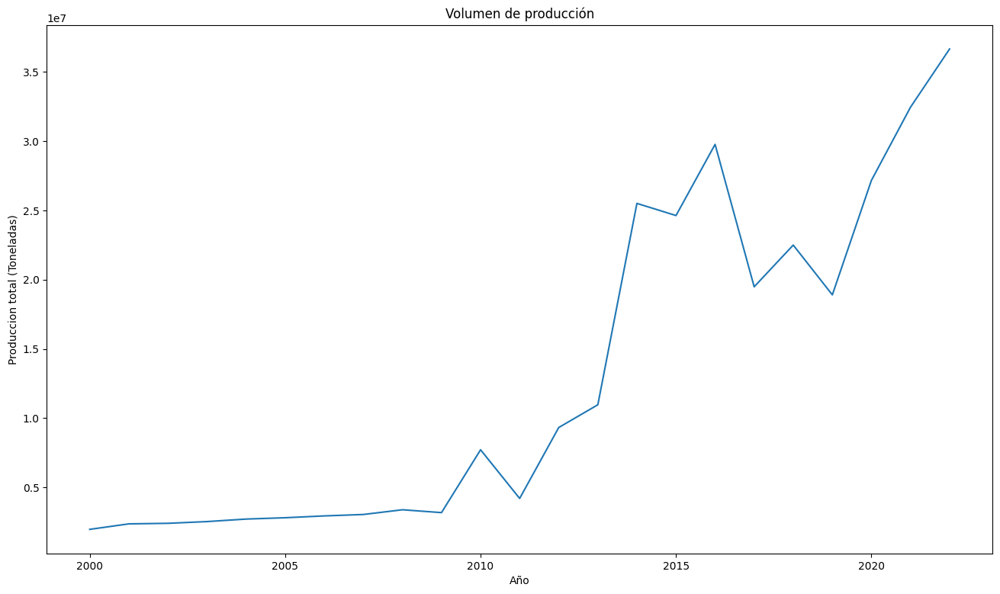

In [96]:
fig, ax = plt.subplots(figsize=(16, 9))
ax.plot(MeanProdY.index, MeanProdY.values)
ax.set_xlabel('Año')
ax.set_ylabel('Produccion total (Toneladas)')
ax.set_title('Volumen de producción')

In [97]:
ByCountry = df.groupby('Country')
MeanProd = ByCountry['Production'].mean()
MeanPop = ByCountry['Population'].mean()

In [98]:
MeanPop.info()

<class 'pandas.core.series.Series'>
Index: 23 entries, Argentina to Venezuela (Bolivarian Republic of)
Series name: Population
Non-Null Count  Dtype  
--------------  -----  
23 non-null     float64
dtypes: float64(1)
memory usage: 368.0+ bytes


En este diagrama de puntos evaluamos la posible relación entre la dos principales variables del dataset: Población y Producción, sin embargo, en esta primera evaluación no se puede identificar una relación compun para ellos se concluye que deben ser agregados nuevos campos que nos permitan generar una relación

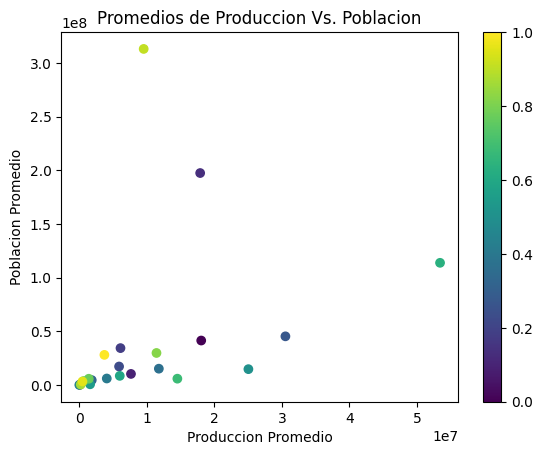

In [99]:
colors = plt.cm.viridis(np.linspace(0, 1, len(MeanProd)))
fig, ax = plt.subplots()
color_Map = ax.scatter(MeanProd, MeanPop, c=colors)
fig.colorbar(color_Map)
ax.set_title('Promedios de Produccion Vs. Poblacion')
ax.set_xlabel('Produccion Promedio')
ax.set_ylabel('Poblacion Promedio')
plt.show()

In [100]:
ByItemType = df.groupby('Item Group')
MeanProdType = ByItemType['Production'].mean()

El volumen de producción promedio de todo el dataset según grupo de alimento, dado que los cultivos de caña de azucar son más voluminosos en pesada, se observa que es la mayor producción promedio de las categorías de alimentos en relación a otras categorías que en pesaje representan menor cantidad. Sin embargo, en evaluaciones futuras notaremos que son categaría con mayor catidad de tipos de alimentos.

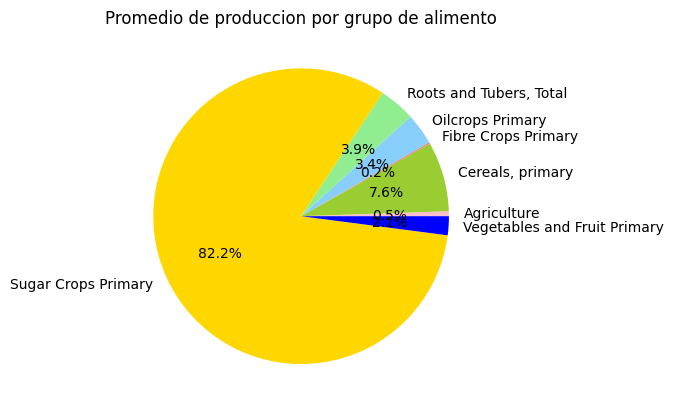

In [101]:
color_list = ['pink', 'yellowgreen', 'lightcoral', 'lightskyblue', 'lightgreen', 'gold', 'blue']
plt.pie(MeanProdType, labels=MeanProdType.index, autopct="%1.1f%%", colors=color_list)
plt.title("Promedio de produccion por grupo de alimento")
plt.show()

# *3 Visualizaciones Seaborn*

Se elabora un gracfico de puntos de las toneladas de producción por país según el grupo de producto al que corresponde.

*Nota:*
Me diante este análisis se puede evidenciar que el volumen expresado en toneladas es mayor para el tipo de cultivos relacionados a cultivos primarios de azucar, esto se debe a que el pesaje de este tipo de cultivos es pesado y suele ser tratado como materia prima para procesos inductriales (e.g.: Caña de Azucar para obtener azucar)

<ipython-input-102-52d7443ebaca>:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


[Text(0, 0, 'Argentina'),
 Text(1, 0, 'Belize'),
 Text(2, 0, 'Bolivia (Plurinational State of)'),
 Text(3, 0, 'Brazil'),
 Text(4, 0, 'Canada'),
 Text(5, 0, 'Chile'),
 Text(6, 0, 'Colombia'),
 Text(7, 0, 'Costa Rica'),
 Text(8, 0, 'Ecuador'),
 Text(9, 0, 'El Salvador'),
 Text(10, 0, 'French Guiana'),
 Text(11, 0, 'Guatemala'),
 Text(12, 0, 'Guyana'),
 Text(13, 0, 'Honduras'),
 Text(14, 0, 'Mexico'),
 Text(15, 0, 'Nicaragua'),
 Text(16, 0, 'Panama'),
 Text(17, 0, 'Paraguay'),
 Text(18, 0, 'Peru'),
 Text(19, 0, 'Suriname'),
 Text(20, 0, 'United States of America'),
 Text(21, 0, 'Uruguay'),
 Text(22, 0, 'Venezuela (Bolivarian Republic of)')]

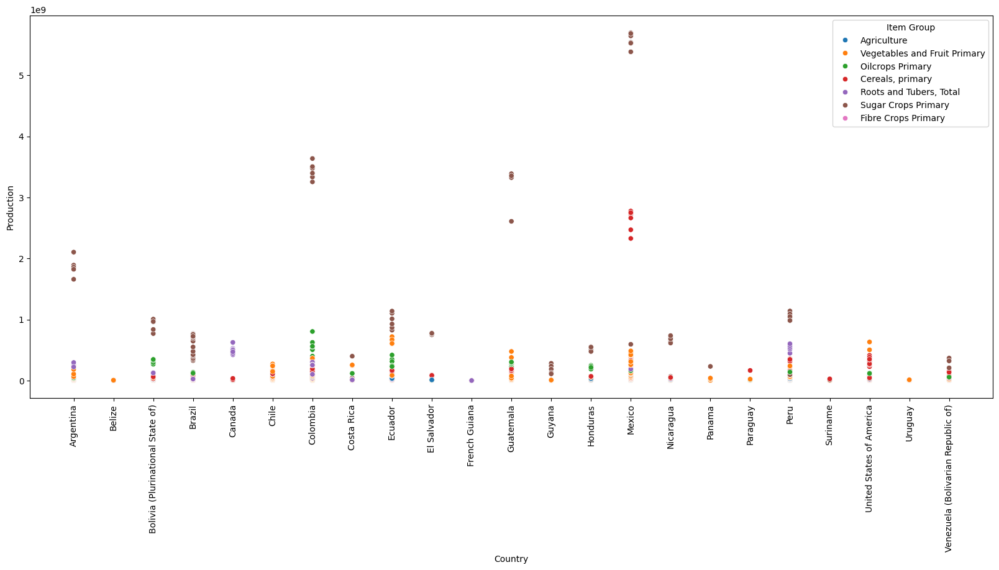

In [102]:
plt.figure(figsize=(20, 8))
ax = sns.scatterplot(data=df, x="Country", y="Production", hue="Item Group")
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

Sin embargo, en el siguiente histograma podemos evaluar la cantidad de veces (counts) que un item aparece para un grupo de items en particular. En ese caso la categoria (Item Group) con mayor cantidad de productos es representada por Vegetales y Frutas primarias, seguida de Agricultura según cada país en evaluación. Esto nos hace pensar que: si bien el volumen en toneladas de producción corresponde a cultivos de Azucar, la mayor variedad y cantidad de productos bajo cultivo es de Vegtales y Frutas un dato alentador en en busca de una autosustentabilidad.

<ipython-input-103-cfbd06aeeadc>:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


[Text(0, 0, 'Argentina'),
 Text(1, 0, 'Belize'),
 Text(2, 0, 'Bolivia (Plurinational State of)'),
 Text(3, 0, 'Brazil'),
 Text(4, 0, 'Canada'),
 Text(5, 0, 'Chile'),
 Text(6, 0, 'Colombia'),
 Text(7, 0, 'Costa Rica'),
 Text(8, 0, 'Ecuador'),
 Text(9, 0, 'El Salvador'),
 Text(10, 0, 'French Guiana'),
 Text(11, 0, 'Guatemala'),
 Text(12, 0, 'Guyana'),
 Text(13, 0, 'Honduras'),
 Text(14, 0, 'Mexico'),
 Text(15, 0, 'Nicaragua'),
 Text(16, 0, 'Panama'),
 Text(17, 0, 'Paraguay'),
 Text(18, 0, 'Peru'),
 Text(19, 0, 'Suriname'),
 Text(20, 0, 'United States of America'),
 Text(21, 0, 'Uruguay'),
 Text(22, 0, 'Venezuela (Bolivarian Republic of)')]

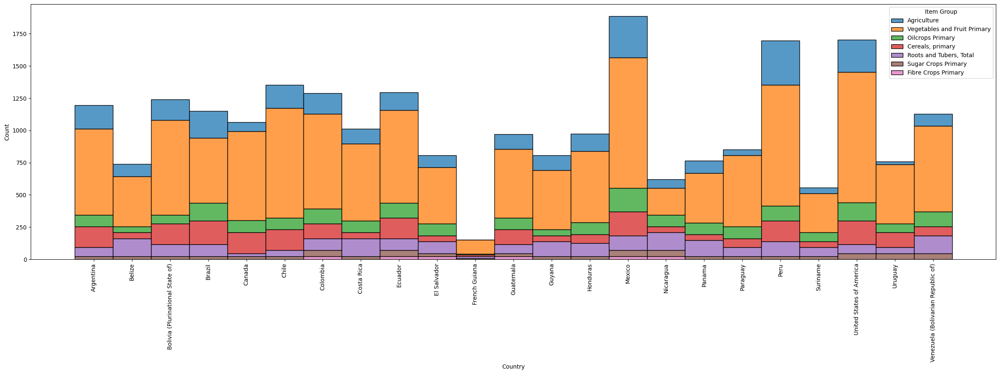

In [103]:
plt.figure(figsize=(30, 8))
ax = sns.histplot(data=df, x='Country', hue="Item Group", multiple="stack")
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

Nuestras principales variables numéricas no presentan una relación directa principalmente porque la población está medida en cantidad personas y la producción está medida en toneladas de producción, tal como se muestra en el gráfico de líneas.

Para aproximar nuestras variables en la siguiente etapa se genera una valoración objetivo de por ejemplo volumen de Kcal recomendadas para una persona tipo y esta compararla con el total Kcal que se pueden producir basados en el DataSet (Hipotesis a validar)

<Axes: xlabel='Year', ylabel='Population'>

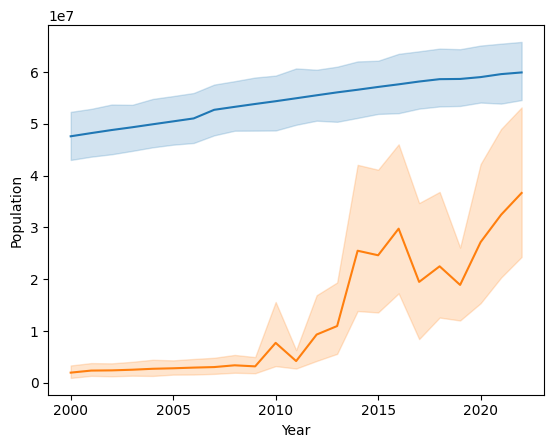

In [104]:
sns.lineplot(data = df, y="Population", x='Year')
sns.lineplot(data = df, y="Production", x='Year')

# Manipulación de DataSet

### Agregar columnas para unificar valores

Supuestos de evauación, individuo tipo tiene una dieta diaria recomendada de:


*   Kcal: 2000 Kcal
*   Carb: 200 gr
*   Prot: 150 gr
*   Fat: 67 gr


1.   Calcular totales de Macros y Kcal producidas por país anualmente
2.   Calular demanda de Macros y Kcal de la publación por país anualmente basado en los supuestos de la dieta recomendada



In [314]:
df = df[df['Item Group'] != 'Sugar Crops Primary']
NewDf = df
NewDf['TPCarb'] = NewDf.apply(lambda row: (row['Production']* 10000 * row['Carb g.']), axis=1) # LLevar por regla de tres el valor de Carb a total de carb segun produccion
NewDf['TPProt'] = NewDf.apply(lambda row: (row['Production']* 10000 * row['Prot g.']), axis=1) # LLevar por regla de tres el valor de Prot a total de prot segun produccion
NewDf['TPFat'] = NewDf.apply(lambda row: (row['Production']* 10000 * row['Fat g.']), axis=1) # LLevar por regla de tres el valor de Fat a total de Fat segun produccion
NewDf['TPKcal'] = NewDf.apply(lambda row: (row['Production']* 10000 * row['Kcal']), axis=1) # LLevar por regla de tres el valor de Kcal a total de Kcal segun produccion
NewDf['TDKcal'] = NewDf.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal segun población total de cada pais
NewDf['TDCarb'] = NewDf.apply(lambda row: (row['Population']* 200 * 365), axis=1) # Demanda anual de Carb segun población total de cada pais
NewDf['TDProt'] = NewDf.apply(lambda row: (row['Population']* 150 * 365), axis=1) # Demanda anual de Prot segun población total de cada pais
NewDf['TDFat'] = NewDf.apply(lambda row: (row['Population']* 67 * 365), axis=1) # Demanda anual de Fat segun población total de cada pais
NewDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
0,32,Argentina,2000,Agriculture,Lupins,120,119,9.88,15.57,2.92,37070774,1.185600e+07,18684000.0,3504000.0,142800000,27061665020000,2706166502000,2029624876500,906565778170
1,32,Argentina,2000,Agriculture,"Chick peas, dry",1200,378,62.95,20.47,6.04,37070774,7.554000e+08,245640000.0,72480000.0,4536000000,27061665020000,2706166502000,2029624876500,906565778170
2,32,Argentina,2000,Vegetables and Fruit Primary,Papayas,2101,43,10.82,0.47,0.26,37070774,2.273282e+08,9874700.0,5462600.0,903430000,27061665020000,2706166502000,2029624876500,906565778170
3,32,Argentina,2000,Agriculture,"Chillies and peppers, dry (Capsicum spp., Pime...",3100,324,69.86,10.58,5.81,37070774,2.165660e+09,327980000.0,180110000.0,10044000000,27061665020000,2706166502000,2029624876500,906565778170
4,32,Argentina,2000,Vegetables and Fruit Primary,Pineapples,3150,50,13.12,0.54,0.12,37070774,4.132800e+08,17010000.0,3780000.0,1575000000,27061665020000,2706166502000,2029624876500,906565778170


In [106]:
NewDf.groupby(['Country', 'Item Group']).agg({'Production': 'sum'})


Production
Country                            Item Group                              
Argentina                          Agriculture                     42910908
                                   Cereals, primary              1149451804
                                   Oilcrops Primary              1183621552
                                   Roots and Tubers, Total       2842770646
                                   Vegetables and Fruit Primary  4840123847
...                                                                     ...
Venezuela (Bolivarian Republic of) Agriculture                     25201994
                                   Cereals, primary               668982108
                                   Oilcrops Primary               311502841
                                   Roots and Tubers, Total        511850676
                                   Vegetables and Fruit Primary  1619496012

[120 rows x 1 columns]

# Argentina

Como método para reducir el volumen de variabilidad se extrae del dataset el bloque de valores de cada país en este caso con Argentina.

In [108]:
ArgDf = NewDf[NewDf['Country'] == 'Argentina']
#ArgDf = ArgDf[ArgDf['Item Group'] != 'Sugar Crops Primary']
ArgDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
0,32,Argentina,2000,Agriculture,Lupins,120,119,9.88,15.57,2.92,37070774,1.185600e+07,18684000.0,3504000.0,142800000,27061665020000,2706166502000,2029624876500,906565778170
1,32,Argentina,2000,Agriculture,"Chick peas, dry",1200,378,62.95,20.47,6.04,37070774,7.554000e+08,245640000.0,72480000.0,4536000000,27061665020000,2706166502000,2029624876500,906565778170
2,32,Argentina,2000,Vegetables and Fruit Primary,Papayas,2101,43,10.82,0.47,0.26,37070774,2.273282e+08,9874700.0,5462600.0,903430000,27061665020000,2706166502000,2029624876500,906565778170
3,32,Argentina,2000,Agriculture,"Chillies and peppers, dry (Capsicum spp., Pime...",3100,324,69.86,10.58,5.81,37070774,2.165660e+09,327980000.0,180110000.0,10044000000,27061665020000,2706166502000,2029624876500,906565778170
4,32,Argentina,2000,Vegetables and Fruit Primary,Pineapples,3150,50,13.12,0.54,0.12,37070774,4.132800e+08,17010000.0,3780000.0,1575000000,27061665020000,2706166502000,2029624876500,906565778170


In [109]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationArg = ArgDf.groupby('Year',)['Population'].mean()
PopulationArg = pd.DataFrame(PopulationArg)
PopulationArg = PopulationArg.reset_index()
PopulationArg.columns = ['Year', 'Population']
PopulationArg

,Year,Population
0,2000,37070774.0
1,2001,37480493.0
2,2002,37885028.0
3,2003,38278164.0
4,2004,38668796.0
5,2005,39070501.0
6,2006,39476851.0
7,2007,39876111.0
8,2008,40273769.0
9,2009,40684338.0


De los resultados anteriores se realiza un gráfico de puntos para validar la hipotesis que la población tiene un aumento constante año a año, es decir, representa una regreción lineal

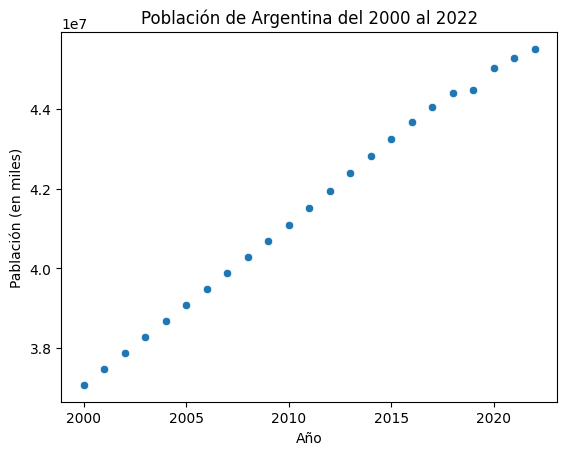

In [110]:
sns.scatterplot(data=PopulationArg, x="Year", y="Population")

plt.title("Población de Argentina del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()


Se plante un modelo de regreción lineal para predecir el volumen de población de 2023 hasta 2050

In [111]:
# Extraer el año y la población de ArgDf
years = ArgDf['Year'].values.reshape(-1, 1)
population = ArgDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationArg = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationArg.round()


array([46246527., 46643007., 47039488., 47435968., 47832448., 48228928.,
       48625409., 49021889., 49418369., 49814849., 50211330., 50607810.,
       51004290., 51400770., 51797251., 52193731., 52590211., 52986691.,
       53383172., 53779652., 54176132., 54572612., 54969093., 55365573.,
       55762053., 56158533., 56555014., 56951494.])

Armar table data con el total de la población estimada más la demanda en Kcal de dicha población

In [112]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población

data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationArg.round()}

ArgTotal = pd.DataFrame(data)
ArgTotal['TDKcal'] = ArgTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
ArgTotal

,Year,Population,TDKcal
0,2023,46246527.0,3.375996e+13
1,2024,46643007.0,3.404940e+13
2,2025,47039488.0,3.433883e+13
3,2026,47435968.0,3.462826e+13
4,2027,47832448.0,3.491769e+13
5,2028,48228928.0,3.520712e+13
6,2029,48625409.0,3.549655e+13
7,2030,49021889.0,3.578598e+13
8,2031,49418369.0,3.607541e+13
9,2032,49814849.0,3.636484e+13


In [113]:
# listar productos a considerar para cubrir la demanda de Kcal requeridas por la población del país seleccionado
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = ArgDf[ArgDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

ArgDemandproduction = pd.DataFrame(data)
ArgDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,Lupins,142800000,120,Agriculture
1,2000,"Chick peas, dry",4536000000,1200,Agriculture
2,2000,Papayas,903430000,2101,Vegetables and Fruit Primary
3,2000,"Chillies and peppers, dry (Capsicum spp., Pime...",10044000000,3100,Agriculture
4,2000,Pineapples,1575000000,3150,Vegetables and Fruit Primary
...,...,...,...,...,...
881,2022,"Walnuts, in shell",14804251380000,2263647,Agriculture
882,2022,Apricots,1320821280000,2751711,Vegetables and Fruit Primary
883,2022,Quinces,1665623790000,2922147,Vegetables and Fruit Primary
884,2022,Artichokes,1429603230000,3041709,Vegetables and Fruit Primary


In [114]:
alt.Chart(ArgDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [115]:
data = []

for year in range(2023, 2051):
  target_kcal = ArgTotal[ArgTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(ArgDemandproduction) - 1)
    item = ArgDemandproduction.iloc[random_index]['Item']
    kcal = ArgDemandproduction.iloc[random_index]['TPKcal']



    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break


  data.append({'Year': year, 'Items': items})


result_df = pd.DataFrame(data)
result_df_transformed_Arg = result_df.explode('Items')
result_df_transformed_Arg['TPKcal'] = result_df_transformed_Arg.apply(lambda row: ArgDemandproduction[ArgDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Arg['Production'] = result_df_transformed_Arg.apply(lambda row: ArgDemandproduction[ArgDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Arg['Item Group'] = result_df_transformed_Arg.apply(lambda row: ArgDemandproduction[ArgDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Arg



,Year,Items,TPKcal,Production,Item Group
0,2023,Grapes,1648106200000,2459860,Vegetables and Fruit Primary
0,2023,"Walnuts, in shell",5964591180000,912017,Agriculture
0,2023,Rye,392603900000,116155,"Cereals, primary"
0,2023,Pears,292725780000,513554,Vegetables and Fruit Primary
0,2023,Strawberries,281612480000,880039,Vegetables and Fruit Primary
...,...,...,...,...,...
27,2050,Papayas,903430000,2101,Vegetables and Fruit Primary
27,2050,Millet,57024800000,47920,"Cereals, primary"
27,2050,"Cassava, fresh",272000000000,170000,"Roots and Tubers, Total"
27,2050,Millet,57024800000,47920,"Cereals, primary"


In [116]:
alt.Chart(result_df_transformed_Arg).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)


alt.Chart(...)

# Belice

In [117]:
BelDf = NewDf[NewDf['Country'] == 'Belize']
BelDf = BelDf[BelDf['Item Group'] != 'Sugar Crops Primary']
BelDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
52,84,Belize,2000,"Roots and Tubers, Total",Yams,11,116,27.48,1.49,0.14,240406,3022800.0,163900.0,15400.0,12760000,175496380000,17549638000,13162228500,5879128730
53,84,Belize,2000,"Roots and Tubers, Total",Edible roots and tubers with high starch or in...,12,22,3.26,3.09,0.34,240406,391200.0,370800.0,40800.0,2640000,175496380000,17549638000,13162228500,5879128730
54,84,Belize,2000,Agriculture,Cocoa beans,30,220,58.30,18.10,13.10,240406,17490000.0,5430000.0,3930000.0,66000000,175496380000,17549638000,13162228500,5879128730
55,84,Belize,2000,Vegetables and Fruit Primary,Cucumbers and gherkins,110,15,3.63,0.65,0.11,240406,3993000.0,715000.0,121000.0,16500000,175496380000,17549638000,13162228500,5879128730
56,84,Belize,2000,Vegetables and Fruit Primary,"Onions and shallots, green",127,40,9.34,1.10,0.10,240406,11861800.0,1397000.0,127000.0,50800000,175496380000,17549638000,13162228500,5879128730


In [118]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationBel = BelDf.groupby('Year',)['Population'].mean()
PopulationBel = pd.DataFrame(PopulationBel)
PopulationBel = PopulationBel.reset_index()
PopulationBel.columns = ['Year', 'Population']
PopulationBel

,Year,Population
0,2000,240406.0
1,2001,248100.0
2,2002,255987.0
3,2003,263998.0
4,2004,272128.0
5,2005,280375.0
6,2006,288729.0
7,2007,297173.0
8,2008,305671.0
9,2009,314171.0


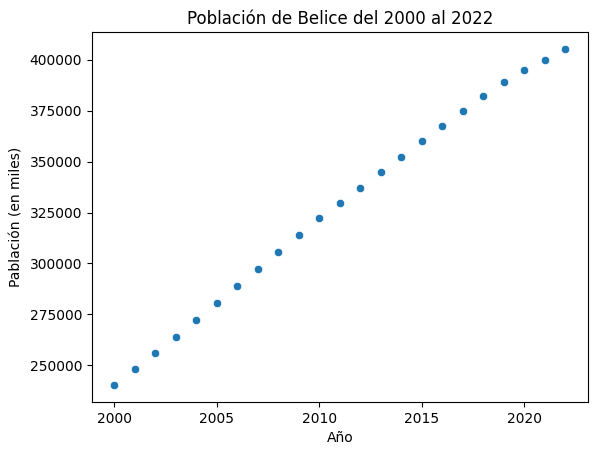

In [119]:
sns.scatterplot(data=PopulationBel, x="Year", y="Population")

plt.title("Población de Belice del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()


In [120]:
# Extraer el año y la población de ArgDf
years = BelDf['Year'].values.reshape(-1, 1)
population = BelDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationBel = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationBel.round()


array([419385., 427068., 434751., 442434., 450117., 457800., 465483.,
       473166., 480849., 488532., 496215., 503898., 511581., 519264.,
       526947., 534630., 542313., 549996., 557679., 565362., 573045.,
       580728., 588411., 596094., 603777., 611460., 619143., 626826.])

In [121]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población

data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationBel.round()}

BelTotal = pd.DataFrame(data)
BelTotal['TDKcal'] = BelTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
BelTotal

,Year,Population,TDKcal
0,2023,419385.0,3.061510e+11
1,2024,427068.0,3.117596e+11
2,2025,434751.0,3.173682e+11
3,2026,442434.0,3.229768e+11
4,2027,450117.0,3.285854e+11
5,2028,457800.0,3.341940e+11
6,2029,465483.0,3.398026e+11
7,2030,473166.0,3.454112e+11
8,2031,480849.0,3.510198e+11
9,2032,488532.0,3.566284e+11


In [122]:
# listar productos a considerar para cubrir la demanda de Kcal requeridas por la población del país seleccionado
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = BelDf[BelDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

BelDemandproduction = pd.DataFrame(data)
BelDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,Yams,12760000,11,"Roots and Tubers, Total"
1,2000,Edible roots and tubers with high starch or in...,2640000,12,"Roots and Tubers, Total"
2,2000,Cocoa beans,66000000,30,Agriculture
3,2000,Cucumbers and gherkins,16500000,110,Vegetables and Fruit Primary
4,2000,"Onions and shallots, green",50800000,127,Vegetables and Fruit Primary
...,...,...,...,...,...
646,2022,Rice,19973200000,15364,"Cereals, primary"
647,2022,Edible roots and tubers with high starch or in...,4258980000,19359,"Roots and Tubers, Total"
648,2022,Soya beans,39888450000,27135,Oilcrops Primary
649,2022,Bananas,76726900000,86210,Vegetables and Fruit Primary


In [123]:
alt.Chart(BelDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [124]:
data = []

for year in range(2023, 2051):
  target_kcal = BelTotal[BelTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(BelDemandproduction) - 1)
    item = BelDemandproduction.iloc[random_index]['Item']
    kcal = BelDemandproduction.iloc[random_index]['TPKcal']



    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break


  data.append({'Year': year, 'Items': items})


result_df = pd.DataFrame(data)
result_df_transformed_Bel = result_df.explode('Items')
result_df_transformed_Bel['TPKcal'] = result_df_transformed_Bel.apply(lambda row: BelDemandproduction[BelDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Bel['Production'] = result_df_transformed_Bel.apply(lambda row: BelDemandproduction[BelDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Bel['Item Group'] = result_df_transformed_Bel.apply(lambda row: BelDemandproduction[BelDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Bel


,Year,Items,TPKcal,Production,Item Group
0,2023,Cantaloupes and other melons,60200000,215,Vegetables and Fruit Primary
0,2023,Maize (corn),114199200000,31722,"Cereals, primary"
1,2024,Yams,12760000,11,"Roots and Tubers, Total"
1,2024,Edible roots and tubers with high starch or in...,2640000,12,"Roots and Tubers, Total"
1,2024,Cucumbers and gherkins,16500000,110,Vegetables and Fruit Primary
...,...,...,...,...,...
27,2050,"Onions and shallots, green",50800000,127,Vegetables and Fruit Primary
27,2050,Pineapples,1101000000,2202,Vegetables and Fruit Primary
27,2050,Cabbages,461250000,1845,Vegetables and Fruit Primary
27,2050,Maize (corn),114199200000,31722,"Cereals, primary"


In [125]:
alt.Chart(result_df_transformed_Bel).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# Bolivia

In [126]:
BolDf = NewDf[NewDf['Country'] == 'Bolivia (Plurinational State of)']
BolDf = BolDf[BolDf['Item Group'] != 'Sugar Crops Primary']
BolDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
84,68,Bolivia (Plurinational State of),2000,"Cereals, primary",Rye,205,338,75.86,10.34,1.63,8592656,155513000.0,21197000.0,3341500.0,692900000,6272638880000,627263888000,470447916000,210133402480
85,68,Bolivia (Plurinational State of),2000,Agriculture,"Chick peas, dry",326,378,62.95,20.47,6.04,8592656,205217000.0,66732200.0,19690400.0,1232280000,6272638880000,627263888000,470447916000,210133402480
86,68,Bolivia (Plurinational State of),2000,Vegetables and Fruit Primary,Sour cherries,545,42,10.45,0.69,0.21,8592656,56952500.0,3760500.0,1144500.0,228900000,6272638880000,627263888000,470447916000,210133402480
87,68,Bolivia (Plurinational State of),2000,Agriculture,"Pepper (Piper spp.), raw",639,29,6.70,0.80,0.41,8592656,42813000.0,5112000.0,2619900.0,185310000,6272638880000,627263888000,470447916000,210133402480
88,68,Bolivia (Plurinational State of),2000,Vegetables and Fruit Primary,Cherries,700,50,12.18,1.00,0.30,8592656,85260000.0,7000000.0,2100000.0,350000000,6272638880000,627263888000,470447916000,210133402480


In [127]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationBol = BolDf.groupby('Year',)['Population'].mean()
PopulationBol = pd.DataFrame(PopulationBol)
PopulationBol = PopulationBol.reset_index()
PopulationBol.columns = ['Year', 'Population']
PopulationBol

,Year,Population
0,2000,8592656.0
1,2001,8746084.0
2,2002,8900583.0
3,2003,9057378.0
4,2004,9216279.0
5,2005,9377388.0
6,2006,9542663.0
7,2007,9711152.0
8,2008,9880593.0
9,2009,10051317.0


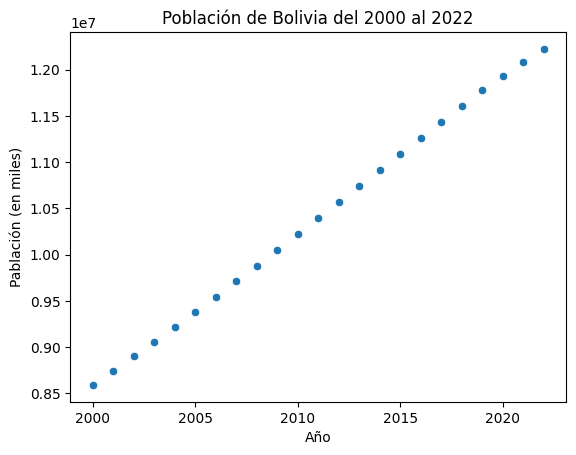

In [128]:
sns.scatterplot(data=PopulationBol, x="Year", y="Population")

plt.title("Población de Bolivia del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()


In [129]:
# Extraer el año y la población de ArgDf
years = BolDf['Year'].values.reshape(-1, 1)
population = BolDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationBol = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationBol.round()

array([12426564., 12594943., 12763323., 12931702., 13100082., 13268461.,
       13436840., 13605220., 13773599., 13941979., 14110358., 14278738.,
       14447117., 14615497., 14783876., 14952255., 15120635., 15289014.,
       15457394., 15625773., 15794153., 15962532., 16130912., 16299291.,
       16467670., 16636050., 16804429., 16972809.])

In [130]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población

data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationBol.round()}

BolTotal = pd.DataFrame(data)
BolTotal['TDKcal'] = BolTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
BolTotal

,Year,Population,TDKcal
0,2023,12426564.0,9.071392e+12
1,2024,12594943.0,9.194308e+12
2,2025,12763323.0,9.317226e+12
3,2026,12931702.0,9.440142e+12
4,2027,13100082.0,9.563060e+12
5,2028,13268461.0,9.685977e+12
6,2029,13436840.0,9.808893e+12
7,2030,13605220.0,9.931811e+12
8,2031,13773599.0,1.005473e+13
9,2032,13941979.0,1.017764e+13


In [131]:
# listar productos a considerar para cubrir la demanda de Kcal requeridas por la población del país seleccionado
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = BolDf[BolDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

BolDemandproduction = pd.DataFrame(data)
BolDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,Rye,692900000,205,"Cereals, primary"
1,2000,"Chick peas, dry",1232280000,326,Agriculture
2,2000,Sour cherries,228900000,545,Vegetables and Fruit Primary
3,2000,"Pepper (Piper spp.), raw",185310000,639,Agriculture
4,2000,Cherries,350000000,700,Vegetables and Fruit Primary
...,...,...,...,...,...
965,2022,Cocoa beans,1274141000000,579155,Agriculture
966,2022,Watermelons,180371400000,601238,Vegetables and Fruit Primary
967,2022,Pineapples,432568000000,865136,Vegetables and Fruit Primary
968,2022,"Chillies and peppers, green (Capsicum spp. and...",344019460000,1186274,Vegetables and Fruit Primary


In [132]:
alt.Chart(BolDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [133]:
data = []

for year in range(2023, 2051):
  target_kcal = BolTotal[BolTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(BolDemandproduction) - 1)
    item = BolDemandproduction.iloc[random_index]['Item']
    kcal = BolDemandproduction.iloc[random_index]['TPKcal']



    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break


  data.append({'Year': year, 'Items': items})


result_df = pd.DataFrame(data)
result_df_transformed_Bol = result_df.explode('Items')
result_df_transformed_Bol['TPKcal'] = result_df_transformed_Bol.apply(lambda row: BolDemandproduction[BolDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Bol['Production'] = result_df_transformed_Bol.apply(lambda row: BolDemandproduction[BolDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Bol['Item Group'] = result_df_transformed_Bol.apply(lambda row: BolDemandproduction[BolDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Bol


,Year,Items,TPKcal,Production,Item Group
0,2023,"Pumpkins, squash and gourds",28332200000,108970,Vegetables and Fruit Primary
0,2023,Cauliflowers and broccoli,1054000000,3100,Vegetables and Fruit Primary
0,2023,Cucumbers and gherkins,525000000,3500,Vegetables and Fruit Primary
0,2023,"Chick peas, dry",1232280000,326,Agriculture
0,2023,"Chick peas, dry",1232280000,326,Agriculture
...,...,...,...,...,...
27,2050,Rice,388807900000,299083,"Cereals, primary"
27,2050,Quinoa,28542000000,23785,"Cereals, primary"
27,2050,Sunflower seed,645320000000,110500,Oilcrops Primary
27,2050,"Pumpkins, squash and gourds",28332200000,108970,Vegetables and Fruit Primary


In [134]:
alt.Chart(result_df_transformed_Bol).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)


alt.Chart(...)

# Brasil

In [135]:
BraDf = NewDf[NewDf['Country'] == 'Brazil']
BraDf = BraDf[BraDf['Item Group'] != 'Sugar Crops Primary']
BraDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
138,76,Brazil,2000,Agriculture,"Almonds, in shell",0,579,21.55,21.15,49.93,175873720,0.0,0.0,0.0,0,128387815600000,12838781560000,9629086170000,4300991822600
139,76,Brazil,2000,Agriculture,"Chestnuts, in shell",0,131,27.76,2.00,1.38,175873720,0.0,0.0,0.0,0,128387815600000,12838781560000,9629086170000,4300991822600
140,76,Brazil,2000,"Cereals, primary",Triticale,0,336,72.13,13.05,2.09,175873720,0.0,0.0,0.0,0,128387815600000,12838781560000,9629086170000,4300991822600
141,76,Brazil,2000,Oilcrops Primary,Olives,4,115,6.26,0.84,10.68,175873720,250400.0,33600.0,427200.0,4600000,128387815600000,12838781560000,9629086170000,4300991822600
142,76,Brazil,2000,Vegetables and Fruit Primary,Quinces,985,57,15.30,0.40,0.10,175873720,150705000.0,3940000.0,985000.0,561450000,128387815600000,12838781560000,9629086170000,4300991822600


In [136]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationBra = BraDf.groupby('Year',)['Population'].mean()
PopulationBra = pd.DataFrame(PopulationBra)
PopulationBra = PopulationBra.reset_index()
PopulationBra.columns = ['Year', 'Population']
PopulationBra

,Year,Population
0,2000,175873720.0
1,2001,178211881.0
2,2002,180476685.0
3,2003,182629278.0
4,2004,184722043.0
5,2005,186797334.0
6,2006,188820682.0
7,2007,190779453.0
8,2008,192672317.0
9,2009,194517549.0


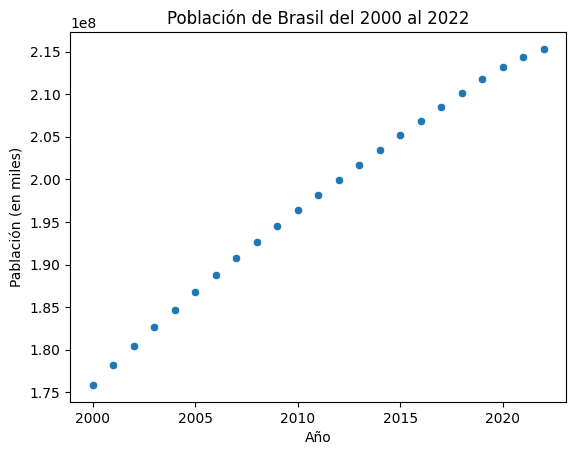

In [137]:
sns.scatterplot(data=PopulationBra, x="Year", y="Population")

plt.title("Población de Brasil del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()


In [138]:
# Extraer el año y la población de ArgDf
years = BraDf['Year'].values.reshape(-1, 1)
population = BraDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationBra = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationBra.round()


array([2.19105582e+08, 2.20913160e+08, 2.22720737e+08, 2.24528314e+08,
       2.26335891e+08, 2.28143468e+08, 2.29951045e+08, 2.31758622e+08,
       2.33566200e+08, 2.35373777e+08, 2.37181354e+08, 2.38988931e+08,
       2.40796508e+08, 2.42604085e+08, 2.44411663e+08, 2.46219240e+08,
       2.48026817e+08, 2.49834394e+08, 2.51641971e+08, 2.53449548e+08,
       2.55257126e+08, 2.57064703e+08, 2.58872280e+08, 2.60679857e+08,
       2.62487434e+08, 2.64295011e+08, 2.66102589e+08, 2.67910166e+08])

In [139]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población

data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationBra.round()}

BraTotal = pd.DataFrame(data)
BraTotal['TDKcal'] = BraTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
BraTotal

,Year,Population,TDKcal
0,2023,219105582.0,1.599471e+14
1,2024,220913160.0,1.612666e+14
2,2025,222720737.0,1.625861e+14
3,2026,224528314.0,1.639057e+14
4,2027,226335891.0,1.652252e+14
5,2028,228143468.0,1.665447e+14
6,2029,229951045.0,1.678643e+14
7,2030,231758622.0,1.691838e+14
8,2031,233566200.0,1.705033e+14
9,2032,235373777.0,1.718229e+14


In [140]:
# listar productos a considerar para cubrir la demanda de Kcal requeridas por la población del país seleccionado
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = BraDf[BraDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

BraDemandproduction = pd.DataFrame(data)
BraDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,"Almonds, in shell",0,0,Agriculture
1,2000,"Chestnuts, in shell",0,0,Agriculture
2,2000,Triticale,0,0,"Cereals, primary"
3,2000,Olives,4600000,4,Oilcrops Primary
4,2000,Quinces,561450000,985,Vegetables and Fruit Primary
...,...,...,...,...,...
1083,2022,Rice,14009148400000,10776268,"Cereals, primary"
1084,2022,Oranges,7956926570000,16929631,Vegetables and Fruit Primary
1085,2022,"Cassava, fresh",28237702400000,17648564,"Roots and Tubers, Total"
1086,2022,Pineapples,11686507500000,23373015,Vegetables and Fruit Primary


In [141]:
alt.Chart(BraDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [142]:
data = []

for year in range(2023, 2051):
  target_kcal = BraTotal[BraTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(BraDemandproduction) - 1)
    item = BraDemandproduction.iloc[random_index]['Item']
    kcal = BraDemandproduction.iloc[random_index]['TPKcal']



    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break


  data.append({'Year': year, 'Items': items})


result_df = pd.DataFrame(data)
result_df_transformed_Bra = result_df.explode('Items')
result_df_transformed_Bra['TPKcal'] = result_df_transformed_Bra.apply(lambda row: BraDemandproduction[BraDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Bra['Production'] = result_df_transformed_Bra.apply(lambda row: BraDemandproduction[BraDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Bra['Item Group'] = result_df_transformed_Bra.apply(lambda row: BraDemandproduction[BraDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Bra


,Year,Items,TPKcal,Production,Item Group
0,2023,Pears,9672900000,16970,Vegetables and Fruit Primary
0,2023,"Coconuts, in shell",6910494180000,1952117,Oilcrops Primary
0,2023,"Almonds, in shell",0,0,Agriculture
0,2023,"Coconuts, in shell",6910494180000,1952117,Oilcrops Primary
0,2023,Peaches and nectarines,71159400000,182460,Vegetables and Fruit Primary
...,...,...,...,...,...
27,2050,Papayas,619076160000,1439712,Vegetables and Fruit Primary
27,2050,"Chestnuts, in shell",0,0,Agriculture
27,2050,"Walnuts, in shell",17095560000,2614,Agriculture
27,2050,Tomatoes,540863460000,3004797,Vegetables and Fruit Primary


In [143]:
alt.Chart(result_df_transformed_Bra).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)


alt.Chart(...)

# Canada

In [144]:
CanDf = NewDf[NewDf['Country'] == 'Canada']
CanDf = CanDf[CanDf['Item Group'] != 'Sugar Crops Primary']
CanDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
188,124,Canada,2000,Vegetables and Fruit Primary,Green garlic,0,149,33.06,6.36,0.50,30683313,0.0,0.0,0.0,0,22398818490000,2239881849000,1679911386750,750360419415
189,124,Canada,2000,Vegetables and Fruit Primary,Kiwi fruit,230,61,14.66,1.14,0.52,30683313,33718000.0,2622000.0,1196000.0,140300000,22398818490000,2239881849000,1679911386750,750360419415
190,124,Canada,2000,Vegetables and Fruit Primary,Apricots,1036,48,11.12,1.40,0.39,30683313,115203200.0,14504000.0,4040400.0,497280000,22398818490000,2239881849000,1679911386750,750360419415
191,124,Canada,2000,Vegetables and Fruit Primary,Watermelons,1576,30,7.55,0.61,0.15,30683313,118988000.0,9613600.0,2364000.0,472800000,22398818490000,2239881849000,1679911386750,750360419415
192,124,Canada,2000,Vegetables and Fruit Primary,Leeks and other alliaceous vegetables,2930,61,14.15,1.50,0.30,30683313,414595000.0,43950000.0,8790000.0,1787300000,22398818490000,2239881849000,1679911386750,750360419415


In [145]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationCan = CanDf.groupby('Year',)['Population'].mean()
PopulationCan = pd.DataFrame(PopulationCan)
PopulationCan = PopulationCan.reset_index()
PopulationCan.columns = ['Year', 'Population']
PopulationCan

,Year,Population
0,2000,30683313.0
1,2001,31002763.0
2,2002,31322398.0
3,2003,31619450.0
4,2004,31911668.0
5,2005,32215916.0
6,2006,32531867.0
7,2007,32862459.0
8,2008,33218541.0
9,2009,33593917.0


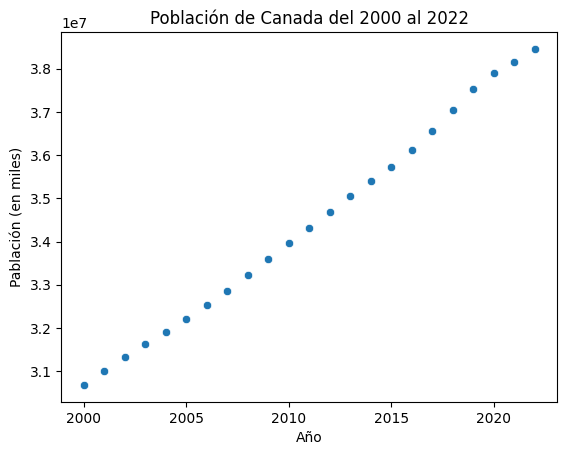

In [146]:
sns.scatterplot(data=PopulationCan, x="Year", y="Population")

plt.title("Población de Canada del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()


In [147]:
# Extraer el año y la población de ArgDf
years = CanDf['Year'].values.reshape(-1, 1)
population = CanDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationCan = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationCan.round()


array([38757031., 39117658., 39478286., 39838913., 40199540., 40560167.,
       40920794., 41281422., 41642049., 42002676., 42363303., 42723930.,
       43084558., 43445185., 43805812., 44166439., 44527066., 44887694.,
       45248321., 45608948., 45969575., 46330203., 46690830., 47051457.,
       47412084., 47772711., 48133339., 48493966.])

In [148]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población

data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationCan.round()}

CanTotal = pd.DataFrame(data)
CanTotal['TDKcal'] = CanTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
CanTotal

,Year,Population,TDKcal
0,2023,38757031.0,2.829263e+13
1,2024,39117658.0,2.855589e+13
2,2025,39478286.0,2.881915e+13
3,2026,39838913.0,2.908241e+13
4,2027,40199540.0,2.934566e+13
5,2028,40560167.0,2.960892e+13
6,2029,40920794.0,2.987218e+13
7,2030,41281422.0,3.013544e+13
8,2031,41642049.0,3.039870e+13
9,2032,42002676.0,3.066195e+13


In [149]:
# listar productos a considerar para cubrir la demanda de Kcal requeridas por la población del país seleccionado
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = CanDf[CanDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

CanDemandproduction = pd.DataFrame(data)
CanDemandproduction


,Year,Item,TPKcal,Production,Item Group
0,2000,Green garlic,0,0,Vegetables and Fruit Primary
1,2000,Kiwi fruit,140300000,230,Vegetables and Fruit Primary
2,2000,Apricots,497280000,1036,Vegetables and Fruit Primary
3,2000,Watermelons,472800000,1576,Vegetables and Fruit Primary
4,2000,Leeks and other alliaceous vegetables,1787300000,2930,Vegetables and Fruit Primary
...,...,...,...,...,...
947,2022,Apples,197896920000,380571,Vegetables and Fruit Primary
948,2022,Rye,1758198260000,520177,"Cereals, primary"
949,2022,Tomatoes,95208840000,528938,Vegetables and Fruit Primary
950,2022,"Lentils, dry",2668693680000,2300598,Agriculture


In [150]:
alt.Chart(CanDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [151]:
data = []

for year in range(2023, 2051):
  target_kcal = CanTotal[CanTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(CanDemandproduction) - 1)
    item = CanDemandproduction.iloc[random_index]['Item']
    kcal = CanDemandproduction.iloc[random_index]['TPKcal']



    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break


  data.append({'Year': year, 'Items': items})


result_df = pd.DataFrame(data)
result_df_transformed_Can = result_df.explode('Items')
result_df_transformed_Can['TPKcal'] = result_df_transformed_Can.apply(lambda row: CanDemandproduction[CanDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Can['Production'] = result_df_transformed_Can.apply(lambda row: CanDemandproduction[CanDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Can['Item Group'] = result_df_transformed_Can.apply(lambda row: CanDemandproduction[CanDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Can


,Year,Items,TPKcal,Production,Item Group
0,2023,Green garlic,0,0,Vegetables and Fruit Primary
0,2023,Watermelons,472800000,1576,Vegetables and Fruit Primary
0,2023,Potatoes,3621755000000,4584500,"Roots and Tubers, Total"
0,2023,Cucumbers and gherkins,12323250000,82155,Vegetables and Fruit Primary
0,2023,Grapes,43005960000,64188,Vegetables and Fruit Primary
...,...,...,...,...,...
27,2050,Tomatoes,75273660000,418187,Vegetables and Fruit Primary
27,2050,Apricots,497280000,1036,Vegetables and Fruit Primary
27,2050,Green garlic,0,0,Vegetables and Fruit Primary
27,2050,"Onions and shallots, dry (excluding dehydrated)",649558800000,186120,Vegetables and Fruit Primary


In [152]:
alt.Chart(result_df_transformed_Can).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# Chile

In [153]:
ChiDf = NewDf[NewDf['Country'] == 'Chile']
ChiDf = ChiDf[ChiDf['Item Group'] != 'Sugar Crops Primary']
ChiDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
234,152,Chile,2000,"Cereals, primary",Triticale,0,336,72.13,13.05,2.09,15351799,0.0,0.0,0.0,0,11206813270000,1120681327000,840510995250,375428244545
235,152,Chile,2000,Oilcrops Primary,Soya beans,0,147,11.05,12.95,6.80,15351799,0.0,0.0,0.0,0,11206813270000,1120681327000,840510995250,375428244545
236,152,Chile,2000,Vegetables and Fruit Primary,Blueberries,182,57,14.49,0.74,0.33,15351799,26371800.0,1346800.0,600600.0,103740000,11206813270000,1120681327000,840510995250,375428244545
237,152,Chile,2000,Agriculture,"Lentils, dry",1027,116,20.13,9.02,0.38,15351799,206735100.0,92635400.0,3902600.0,1191320000,11206813270000,1120681327000,840510995250,375428244545
238,152,Chile,2000,Oilcrops Primary,Hempseed,1100,586,4.67,31.56,48.75,15351799,51370000.0,347160000.0,536250000.0,6446000000,11206813270000,1120681327000,840510995250,375428244545


In [154]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationChi = ChiDf.groupby('Year',)['Population'].mean()
PopulationChi = pd.DataFrame(PopulationChi)
PopulationChi = PopulationChi.reset_index()
PopulationChi.columns = ['Year', 'Population']
PopulationChi

,Year,Population
0,2000,15351799.0
1,2001,15523978.0
2,2002,15693790.0
3,2003,15859112.0
4,2004,16017966.0
5,2005,16175311.0
6,2006,16334575.0
7,2007,16495538.0
8,2008,16661462.0
9,2009,16833447.0


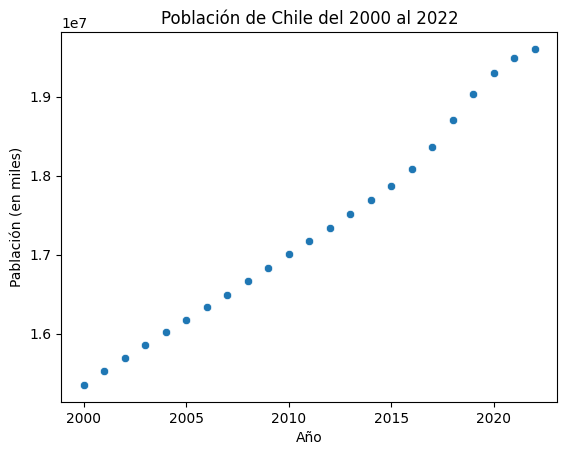

In [155]:
sns.scatterplot(data=PopulationChi, x="Year", y="Population")

plt.title("Población de Chile del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

In [156]:
# Extraer el año y la población de ArgDf
years = ChiDf['Year'].values.reshape(-1, 1)
population = ChiDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationChi = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationChi.round()

array([19626511., 19819612., 20012712., 20205812., 20398912., 20592012.,
       20785113., 20978213., 21171313., 21364413., 21557514., 21750614.,
       21943714., 22136814., 22329915., 22523015., 22716115., 22909215.,
       23102315., 23295416., 23488516., 23681616., 23874716., 24067817.,
       24260917., 24454017., 24647117., 24840217.])

In [157]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población
data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationChi.round()}

ChiTotal = pd.DataFrame(data)
ChiTotal['TDKcal'] = ChiTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
ChiTotal

,Year,Population,TDKcal
0,2023,19626511.0,1.432735e+13
1,2024,19819612.0,1.446832e+13
2,2025,20012712.0,1.460928e+13
3,2026,20205812.0,1.475024e+13
4,2027,20398912.0,1.489121e+13
5,2028,20592012.0,1.503217e+13
6,2029,20785113.0,1.517313e+13
7,2030,20978213.0,1.531410e+13
8,2031,21171313.0,1.545506e+13
9,2032,21364413.0,1.559602e+13


In [158]:
# listar productos a considerar para cubrir la demanda de Kcal requeridas por la población del país seleccionado
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = ChiDf[ChiDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

ChiDemandproduction = pd.DataFrame(data)
ChiDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,Triticale,0,0,"Cereals, primary"
1,2000,Soya beans,0,0,Oilcrops Primary
2,2000,Blueberries,103740000,182,Vegetables and Fruit Primary
3,2000,"Lentils, dry",1191320000,1027,Agriculture
4,2000,Hempseed,6446000000,1100,Oilcrops Primary
...,...,...,...,...,...
985,2022,Artichokes,498846250000,1061375,Vegetables and Fruit Primary
986,2022,Raspberries,612317160000,1177533,Vegetables and Fruit Primary
987,2022,Sweet potatoes,1357978500000,1508865,"Roots and Tubers, Total"
988,2022,Green garlic,3225468560000,2164744,Vegetables and Fruit Primary


In [159]:
alt.Chart(ChiDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [160]:
data = []

for year in range(2023, 2051):
  target_kcal = ChiTotal[ChiTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(ChiDemandproduction) - 1)
    item = ChiDemandproduction.iloc[random_index]['Item']
    kcal = ChiDemandproduction.iloc[random_index]['TPKcal']



    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break


  data.append({'Year': year, 'Items': items})


result_df = pd.DataFrame(data)
result_df_transformed_Chi = result_df.explode('Items')
result_df_transformed_Chi['TPKcal'] = result_df_transformed_Chi.apply(lambda row: ChiDemandproduction[ChiDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Chi['Production'] = result_df_transformed_Chi.apply(lambda row: ChiDemandproduction[ChiDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Chi['Item Group'] = result_df_transformed_Chi.apply(lambda row: ChiDemandproduction[ChiDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Chi

,Year,Items,TPKcal,Production,Item Group
0,2023,Hempseed,6446000000,1100,Oilcrops Primary
0,2023,"Chestnuts, in shell",301300000,230,Agriculture
0,2023,Lettuce and chicory,12600000000,84000,Vegetables and Fruit Primary
0,2023,Sweet potatoes,6750000000,7500,"Roots and Tubers, Total"
0,2023,Oats,964471040000,247936,"Cereals, primary"
...,...,...,...,...,...
27,2050,Triticale,0,0,"Cereals, primary"
27,2050,"Lentils, dry",1191320000,1027,Agriculture
27,2050,Rice,175578000000,135060,"Cereals, primary"
27,2050,Wheat,1970377200000,1492710,"Cereals, primary"


In [161]:
alt.Chart(result_df_transformed_Chi).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# Colombia

In [162]:
ColDf = NewDf[NewDf['Country'] == 'Colombia']
ColDf = ColDf[ColDf['Item Group'] != 'Sugar Crops Primary']
ColDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
292,170,Colombia,2000,Agriculture,"Chick peas, dry",0,378,62.95,20.47,6.04,39215135,0.0,0.0,0.0,0,28627048550000,2862704855000,2147028641250,959006126425
293,170,Colombia,2000,"Cereals, primary",Oats,0,389,66.27,16.89,6.90,39215135,0.0,0.0,0.0,0,28627048550000,2862704855000,2147028641250,959006126425
294,170,Colombia,2000,Oilcrops Primary,Sunflower seed,0,584,20.00,20.78,51.46,39215135,0.0,0.0,0.0,0,28627048550000,2862704855000,2147028641250,959006126425
295,170,Colombia,2000,Vegetables and Fruit Primary,Dates,24,282,75.03,2.45,0.39,39215135,18007200.0,588000.0,93600.0,67680000,28627048550000,2862704855000,2147028641250,959006126425
296,170,Colombia,2000,Vegetables and Fruit Primary,Green garlic,2135,149,33.06,6.36,0.50,39215135,705831000.0,135786000.0,10675000.0,3181150000,28627048550000,2862704855000,2147028641250,959006126425


In [163]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationCol = ColDf.groupby('Year',)['Population'].mean()
PopulationCol = pd.DataFrame(PopulationCol)
PopulationCol = PopulationCol.reset_index()
PopulationCol.columns = ['Year', 'Population']
PopulationCol

,Year,Population
0,2000,39215135.0
1,2001,39837875.0
2,2002,40454050.0
3,2003,41057687.0
4,2004,41648268.0
5,2005,42220940.0
6,2006,42772910.0
7,2007,43306582.0
8,2008,43815313.0
9,2009,44313917.0


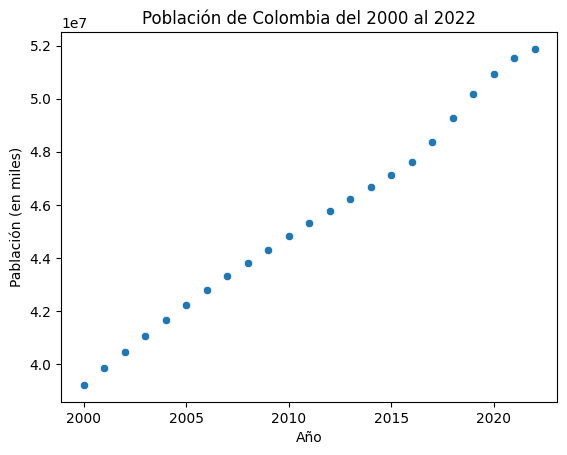

In [309]:
sns.scatterplot(data=PopulationCol, x="Year", y="Population")

plt.title("Población de Colombia del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

In [165]:
# Extraer el año y la población de ArgDf
years = ColDf['Year'].values.reshape(-1, 1)
population = ColDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationCol = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationCol.round()

array([52123478., 52683228., 53242979., 53802729., 54362479., 54922229.,
       55481979., 56041730., 56601480., 57161230., 57720980., 58280730.,
       58840481., 59400231., 59959981., 60519731., 61079481., 61639231.,
       62198982., 62758732., 63318482., 63878232., 64437982., 64997733.,
       65557483., 66117233., 66676983., 67236733.])

In [166]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población
data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationCol.round()}

ColTotal = pd.DataFrame(data)
ColTotal['TDKcal'] = ColTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
ColTotal

,Year,Population,TDKcal
0,2023,52123478.0,3.805014e+13
1,2024,52683228.0,3.845876e+13
2,2025,53242979.0,3.886737e+13
3,2026,53802729.0,3.927599e+13
4,2027,54362479.0,3.968461e+13
5,2028,54922229.0,4.009323e+13
6,2029,55481979.0,4.050184e+13
7,2030,56041730.0,4.091046e+13
8,2031,56601480.0,4.131908e+13
9,2032,57161230.0,4.172770e+13


In [167]:
# listar productos a considerar para cubrir la demanda de Kcal requeridas por la población del país seleccionado
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = ColDf[ColDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

ColDemandproduction = pd.DataFrame(data)
ColDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,"Chick peas, dry",0,0,Agriculture
1,2000,Oats,0,0,"Cereals, primary"
2,2000,Sunflower seed,0,0,Oilcrops Primary
3,2000,Dates,67680000,24,Vegetables and Fruit Primary
4,2000,Green garlic,3181150000,2135,Vegetables and Fruit Primary
...,...,...,...,...,...
1076,2022,Pears,1998495810000,3506133,Vegetables and Fruit Primary
1077,2022,Cabbages,1060406750000,4241627,Vegetables and Fruit Primary
1078,2022,Cantaloupes and other melons,1910770680000,6824181,Vegetables and Fruit Primary
1079,2022,"Chillies and peppers, green (Capsicum spp. and...",2585914050000,8916945,Vegetables and Fruit Primary


In [168]:
alt.Chart(ColDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [169]:
data = []

for year in range(2023, 2051):
  target_kcal = ColTotal[ColTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(ColDemandproduction) - 1)
    item = ColDemandproduction.iloc[random_index]['Item']
    kcal = ColDemandproduction.iloc[random_index]['TPKcal']

    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break
  data.append({'Year': year, 'Items': items})

result_df = pd.DataFrame(data)
result_df_transformed_Col = result_df.explode('Items')
result_df_transformed_Col['TPKcal'] = result_df_transformed_Col.apply(lambda row: ColDemandproduction[ColDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Col['Production'] = result_df_transformed_Col.apply(lambda row: ColDemandproduction[ColDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Col['Item Group'] = result_df_transformed_Col.apply(lambda row: ColDemandproduction[ColDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Col

,Year,Items,TPKcal,Production,Item Group
0,2023,"Chick peas, dry",0,0,Agriculture
0,2023,Cucumbers and gherkins,96298950000,641993,Vegetables and Fruit Primary
0,2023,"Coffee, green",6371400000,637140,Agriculture
0,2023,Dates,67680000,24,Vegetables and Fruit Primary
0,2023,Barley,15117930000,12291,"Cereals, primary"
...,...,...,...,...,...
27,2050,Spinach,2206160000,9592,Vegetables and Fruit Primary
27,2050,"Coffee, green",6371400000,637140,Agriculture
27,2050,Cocoa beans,80808200000,36731,Agriculture
27,2050,Sesame seed,23238450000,4113,Oilcrops Primary


In [170]:
alt.Chart(result_df_transformed_Col).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# Costa Rica

In [171]:
CosRDf = NewDf[NewDf['Country'] == 'Costa Rica']
CosRDf = CosRDf[CosRDf['Item Group'] != 'Sugar Crops Primary']
CosRDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
348,188,Costa Rica,2000,Oilcrops Primary,Soya beans,0,147,11.05,12.95,6.80,3979193,0.0,0.0,0.0,0,2904810890000,290481089000,217860816750,97311164815
349,188,Costa Rica,2000,Vegetables and Fruit Primary,Spinach,25,23,3.75,2.97,0.26,3979193,937500.0,742500.0,65000.0,5750000,2904810890000,290481089000,217860816750,97311164815
350,188,Costa Rica,2000,Vegetables and Fruit Primary,Leeks and other alliaceous vegetables,40,61,14.15,1.50,0.30,3979193,5660000.0,600000.0,120000.0,24400000,2904810890000,290481089000,217860816750,97311164815
351,188,Costa Rica,2000,Vegetables and Fruit Primary,Artichokes,50,47,10.51,3.27,0.15,3979193,5255000.0,1635000.0,75000.0,23500000,2904810890000,290481089000,217860816750,97311164815
352,188,Costa Rica,2000,Vegetables and Fruit Primary,"Onions and shallots, green",55,40,9.34,1.10,0.10,3979193,5137000.0,605000.0,55000.0,22000000,2904810890000,290481089000,217860816750,97311164815


In [172]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationCosR = CosRDf.groupby('Year',)['Population'].mean()
PopulationCosR = pd.DataFrame(PopulationCosR)
PopulationCosR = PopulationCosR.reset_index()
PopulationCosR.columns = ['Year', 'Population']
PopulationCosR

,Year,Population
0,2000,3979193.0
1,2001,4053222.0
2,2002,4122623.0
3,2003,4188610.0
4,2004,4252800.0
5,2005,4315887.0
6,2006,4378172.0
7,2007,4440019.0
8,2008,4501921.0
9,2009,4563127.0


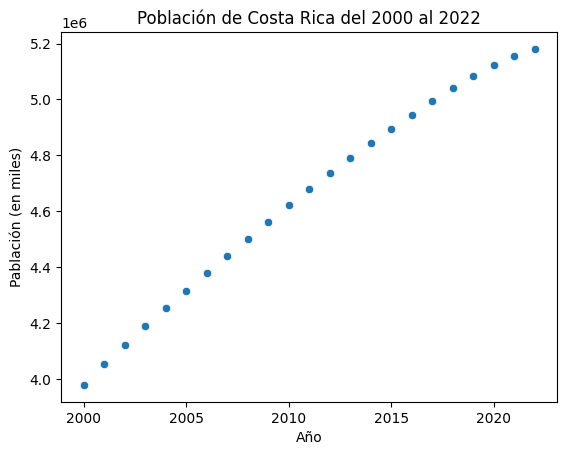

In [310]:
sns.scatterplot(data=PopulationCosR, x="Year", y="Population")

plt.title("Población de Costa Rica del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

In [174]:
# Extraer el año y la población de ArgDf
years = CosRDf['Year'].values.reshape(-1, 1)
population = CosRDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationCosR = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationCosR.round()

array([5314102., 5369669., 5425237., 5480805., 5536373., 5591941.,
       5647508., 5703076., 5758644., 5814212., 5869780., 5925348.,
       5980915., 6036483., 6092051., 6147619., 6203187., 6258755.,
       6314322., 6369890., 6425458., 6481026., 6536594., 6592162.,
       6647729., 6703297., 6758865., 6814433.])

In [175]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población
data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationCosR.round()}

CosRTotal = pd.DataFrame(data)
CosRTotal['TDKcal'] = CosRTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
CosRTotal

,Year,Population,TDKcal
0,2023,5314102.0,3.879294e+12
1,2024,5369669.0,3.919858e+12
2,2025,5425237.0,3.960423e+12
3,2026,5480805.0,4.000988e+12
4,2027,5536373.0,4.041552e+12
5,2028,5591941.0,4.082117e+12
6,2029,5647508.0,4.122681e+12
7,2030,5703076.0,4.163245e+12
8,2031,5758644.0,4.203810e+12
9,2032,5814212.0,4.244375e+12


In [176]:
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = CosRDf[CosRDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

CosRDemandproduction = pd.DataFrame(data)
CosRDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,Soya beans,0,0,Oilcrops Primary
1,2000,Spinach,5750000,25,Vegetables and Fruit Primary
2,2000,Leeks and other alliaceous vegetables,24400000,40,Vegetables and Fruit Primary
3,2000,Artichokes,23500000,50,Vegetables and Fruit Primary
4,2000,"Onions and shallots, green",22000000,55,Vegetables and Fruit Primary
...,...,...,...,...,...
839,2022,Oranges,102065200000,217160,Vegetables and Fruit Primary
840,2022,"Ginger, raw",320076800000,400096,Agriculture
841,2022,"Onions and shallots, dry (excluding dehydrated)",1594148240000,456776,Vegetables and Fruit Primary
842,2022,Strawberries,159116160000,497238,Vegetables and Fruit Primary


In [177]:
alt.Chart(CosRDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [178]:
data = []

for year in range(2023, 2051):
  target_kcal = CosRTotal[CosRTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(CosRDemandproduction) - 1)
    item = CosRDemandproduction.iloc[random_index]['Item']
    kcal = CosRDemandproduction.iloc[random_index]['TPKcal']

    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break
  data.append({'Year': year, 'Items': items})

result_df = pd.DataFrame(data)
result_df_transformed_CosR = result_df.explode('Items')
result_df_transformed_CosR['TPKcal'] = result_df_transformed_CosR.apply(lambda row: CosRDemandproduction[CosRDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_CosR['Production'] = result_df_transformed_CosR.apply(lambda row: CosRDemandproduction[CosRDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_CosR['Item Group'] = result_df_transformed_CosR.apply(lambda row: CosRDemandproduction[CosRDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_CosR

,Year,Items,TPKcal,Production,Item Group
0,2023,"Onions and shallots, dry (excluding dehydrated)",53903050000,15445,Vegetables and Fruit Primary
0,2023,Pomelos and grapefruits,6792500000,17875,Vegetables and Fruit Primary
0,2023,Cabbages,38649250000,154597,Vegetables and Fruit Primary
0,2023,Cantaloupes and other melons,49560000000,177000,Vegetables and Fruit Primary
0,2023,"Onions and shallots, dry (excluding dehydrated)",53903050000,15445,Vegetables and Fruit Primary
...,...,...,...,...,...
27,2050,"Mangoes, guavas and mangosteens",19680000000,32800,Vegetables and Fruit Primary
27,2050,Pomelos and grapefruits,6792500000,17875,Vegetables and Fruit Primary
27,2050,Cucumbers and gherkins,97500000,650,Vegetables and Fruit Primary
27,2050,Maize (corn),66607200000,18502,"Cereals, primary"


In [179]:
alt.Chart(result_df_transformed_CosR).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# Ecuador

In [180]:
EcuDf = NewDf[NewDf['Country'] == 'Ecuador']
EcuDf = EcuDf[EcuDf['Item Group'] != 'Sugar Crops Primary']
EcuDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
392,218,Ecuador,2000,Oilcrops Primary,Sesame seed,14,565,25.74,16.96,48.00,12626507,3603600.0,2374400.0,6720000.0,79100000,9217350110000,921735011000,691301258250,308781228685
393,218,Ecuador,2000,Vegetables and Fruit Primary,Figs,15,74,19.18,0.75,0.30,12626507,2877000.0,112500.0,45000.0,11100000,9217350110000,921735011000,691301258250,308781228685
394,218,Ecuador,2000,"Cereals, primary",Rye,70,338,75.86,10.34,1.63,12626507,53102000.0,7238000.0,1141000.0,236600000,9217350110000,921735011000,691301258250,308781228685
395,218,Ecuador,2000,Oilcrops Primary,Sunflower seed,170,584,20.00,20.78,51.46,12626507,34000000.0,35326000.0,87482000.0,992800000,9217350110000,921735011000,691301258250,308781228685
396,218,Ecuador,2000,Vegetables and Fruit Primary,Cucumbers and gherkins,500,15,3.63,0.65,0.11,12626507,18150000.0,3250000.0,550000.0,75000000,9217350110000,921735011000,691301258250,308781228685


In [181]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationEcu = EcuDf.groupby('Year',)['Population'].mean()
PopulationEcu = pd.DataFrame(PopulationEcu)
PopulationEcu = PopulationEcu.reset_index()
PopulationEcu.columns = ['Year', 'Population']
PopulationEcu

,Year,Population
0,2000,12626507.0
1,2001,12845521.0
2,2002,13070609.0
3,2003,13301184.0
4,2004,13534593.0
5,2005,13770012.0
6,2006,14009061.0
7,2007,14251835.0
8,2008,14496797.0
9,2009,14742766.0


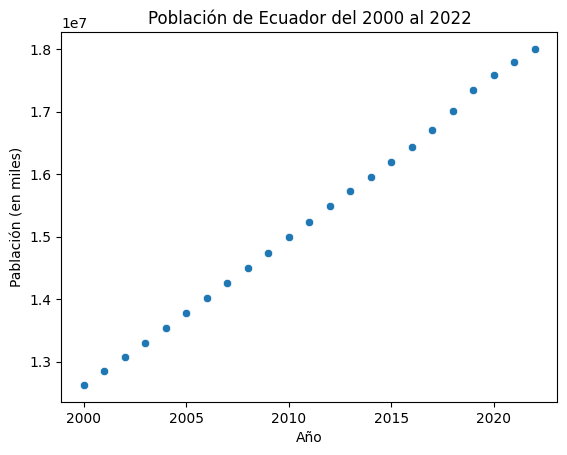

In [182]:
sns.scatterplot(data=PopulationEcu, x="Year", y="Population")

plt.title("Población de Ecuador del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

In [183]:
# Extraer el año y la población de ArgDf
years = EcuDf['Year'].values.reshape(-1, 1)
population = EcuDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationEcu = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationEcu.round()

array([18235098., 18482504., 18729910., 18977315., 19224721., 19472127.,
       19719532., 19966938., 20214344., 20461749., 20709155., 20956561.,
       21203967., 21451372., 21698778., 21946184., 22193589., 22440995.,
       22688401., 22935806., 23183212., 23430618., 23678023., 23925429.,
       24172835., 24420240., 24667646., 24915052.])

In [184]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población
data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationEcu.round()}

EcuTotal = pd.DataFrame(data)
EcuTotal['TDKcal'] = EcuTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
EcuTotal

,Year,Population,TDKcal
0,2023,18235098.0,1.331162e+13
1,2024,18482504.0,1.349223e+13
2,2025,18729910.0,1.367283e+13
3,2026,18977315.0,1.385344e+13
4,2027,19224721.0,1.403405e+13
5,2028,19472127.0,1.421465e+13
6,2029,19719532.0,1.439526e+13
7,2030,19966938.0,1.457586e+13
8,2031,20214344.0,1.475647e+13
9,2032,20461749.0,1.493708e+13


In [185]:
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = EcuDf[EcuDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

EcuDemandproduction = pd.DataFrame(data)
EcuDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,Sesame seed,79100000,14,Oilcrops Primary
1,2000,Figs,11100000,15,Vegetables and Fruit Primary
2,2000,Rye,236600000,70,"Cereals, primary"
3,2000,Sunflower seed,992800000,170,Oilcrops Primary
4,2000,Cucumbers and gherkins,75000000,500,Vegetables and Fruit Primary
...,...,...,...,...,...
1020,2022,Barley,1372076070000,1115509,"Cereals, primary"
1021,2022,"Coconuts, in shell",4341470160000,1226404,Oilcrops Primary
1022,2022,Rice,1628640000000,1252800,"Cereals, primary"
1023,2022,Cabbages,313546000000,1254184,Vegetables and Fruit Primary


In [186]:
alt.Chart(EcuDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [187]:
data = []

for year in range(2023, 2051):
  target_kcal = EcuTotal[EcuTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(EcuDemandproduction) - 1)
    item = EcuDemandproduction.iloc[random_index]['Item']
    kcal = EcuDemandproduction.iloc[random_index]['TPKcal']

    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break
  data.append({'Year': year, 'Items': items})

result_df = pd.DataFrame(data)
result_df_transformed_Ecu = result_df.explode('Items')
result_df_transformed_Ecu['TPKcal'] = result_df_transformed_Ecu.apply(lambda row: EcuDemandproduction[EcuDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Ecu['Production'] = result_df_transformed_Ecu.apply(lambda row: EcuDemandproduction[EcuDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Ecu['Item Group'] = result_df_transformed_Ecu.apply(lambda row: EcuDemandproduction[EcuDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Ecu

,Year,Items,TPKcal,Production,Item Group
0,2023,Oats,4718570000,1213,"Cereals, primary"
0,2023,Figs,11100000,15,Vegetables and Fruit Primary
0,2023,Rye,236600000,70,"Cereals, primary"
0,2023,Oats,4718570000,1213,"Cereals, primary"
0,2023,Sweet potatoes,898200000,998,"Roots and Tubers, Total"
...,...,...,...,...,...
27,2050,Apricots,15108000000,31475,Vegetables and Fruit Primary
27,2050,Cabbages,2370500000,9482,Vegetables and Fruit Primary
27,2050,Quinoa,780000000,650,"Cereals, primary"
27,2050,"Pumpkins, squash and gourds",4680000000,18000,Vegetables and Fruit Primary


In [188]:
alt.Chart(result_df_transformed_Ecu).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# El Salvador

In [189]:
EsaDf = NewDf[NewDf['Country'] == 'El Salvador']
EsaDf = EsaDf[EsaDf['Item Group'] != 'Sugar Crops Primary']
EsaDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
448,222,El Salvador,2000,Vegetables and Fruit Primary,Apples,0,52,13.81,0.26,0.17,5958482,0.0,0.0,0.0,0,4349691860000,434969186000,326226889500,145714677310
449,222,El Salvador,2000,Vegetables and Fruit Primary,Bananas,0,89,22.24,1.09,0.33,5958482,0.0,0.0,0.0,0,4349691860000,434969186000,326226889500,145714677310
450,222,El Salvador,2000,Vegetables and Fruit Primary,Green corn (maize),0,360,18.70,3.27,1.35,5958482,0.0,0.0,0.0,0,4349691860000,434969186000,326226889500,145714677310
451,222,El Salvador,2000,Agriculture,Cocoa beans,150,220,58.30,18.10,13.10,5958482,87450000.0,27150000.0,19650000.0,330000000,4349691860000,434969186000,326226889500,145714677310
452,222,El Salvador,2000,Vegetables and Fruit Primary,"Onions and shallots, dry (excluding dehydrated)",400,349,83.28,8.95,0.46,5958482,333120000.0,35800000.0,1840000.0,1396000000,4349691860000,434969186000,326226889500,145714677310


In [190]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationEsa = EsaDf.groupby('Year',)['Population'].mean()
PopulationEsa = pd.DataFrame(PopulationEsa)
PopulationEsa = PopulationEsa.reset_index()
PopulationEsa.columns = ['Year', 'Population']
PopulationEsa

,Year,Population
0,2000,5958482.0
1,2001,5988095.0
2,2002,6011275.0
3,2003,6026849.0
4,2004,6035655.0
5,2005,6037817.0
6,2006,6034436.0
7,2007,6044131.0
8,2008,6068099.0
9,2009,6091188.0


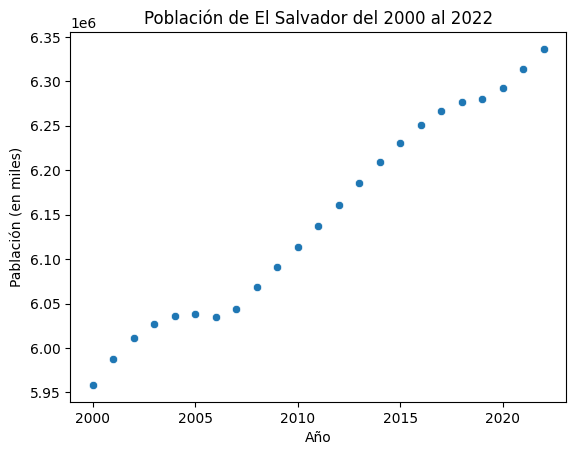

In [191]:
sns.scatterplot(data=PopulationEsa, x="Year", y="Population")

plt.title("Población de El Salvador del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

In [192]:
# Extraer el año y la población de ArgDf
years = EsaDf['Year'].values.reshape(-1, 1)
population = EsaDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationEsa = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationEsa.round()

array([6353533., 6370850., 6388166., 6405482., 6422799., 6440115.,
       6457431., 6474748., 6492064., 6509380., 6526697., 6544013.,
       6561330., 6578646., 6595962., 6613279., 6630595., 6647911.,
       6665228., 6682544., 6699861., 6717177., 6734493., 6751810.,
       6769126., 6786442., 6803759., 6821075.])

In [193]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población
data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationEsa.round()}

EsaTotal = pd.DataFrame(data)
EsaTotal['TDKcal'] = EsaTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
EsaTotal

,Year,Population,TDKcal
0,2023,6353533.0,4.638079e+12
1,2024,6370850.0,4.650720e+12
2,2025,6388166.0,4.663361e+12
3,2026,6405482.0,4.676002e+12
4,2027,6422799.0,4.688643e+12
5,2028,6440115.0,4.701284e+12
6,2029,6457431.0,4.713925e+12
7,2030,6474748.0,4.726566e+12
8,2031,6492064.0,4.739207e+12
9,2032,6509380.0,4.751847e+12


In [194]:
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = EsaDf[EsaDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

EsaDemandproduction = pd.DataFrame(data)
EsaDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,Apples,0,0,Vegetables and Fruit Primary
1,2000,Bananas,0,0,Vegetables and Fruit Primary
2,2000,Green corn (maize),0,0,Vegetables and Fruit Primary
3,2000,Cocoa beans,330000000,150,Agriculture
4,2000,"Onions and shallots, dry (excluding dehydrated)",1396000000,400,Vegetables and Fruit Primary
...,...,...,...,...,...
654,2022,Soya beans,765136470000,520501,Oilcrops Primary
655,2022,"Mangoes, guavas and mangosteens",332861400000,554769,Vegetables and Fruit Primary
656,2022,Cucumbers and gherkins,114857400000,765716,Vegetables and Fruit Primary
657,2022,Potatoes,620719590000,785721,"Roots and Tubers, Total"


In [195]:
alt.Chart(EsaDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [196]:
data = []

for year in range(2023, 2051):
  target_kcal = EsaTotal[EsaTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(EsaDemandproduction) - 1)
    item = EsaDemandproduction.iloc[random_index]['Item']
    kcal = EsaDemandproduction.iloc[random_index]['TPKcal']

    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break
  data.append({'Year': year, 'Items': items})

result_df = pd.DataFrame(data)
result_df_transformed_Esa = result_df.explode('Items')
result_df_transformed_Esa['TPKcal'] = result_df_transformed_Esa.apply(lambda row: EsaDemandproduction[EsaDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Esa['Production'] = result_df_transformed_Esa.apply(lambda row: EsaDemandproduction[EsaDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Esa['Item Group'] = result_df_transformed_Esa.apply(lambda row: EsaDemandproduction[EsaDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Esa

,Year,Items,TPKcal,Production,Item Group
0,2023,"Chillies and peppers, green (Capsicum spp. and...",1066040000,3676,Vegetables and Fruit Primary
0,2023,Cucumbers and gherkins,1275000000,8500,Vegetables and Fruit Primary
0,2023,Watermelons,23625600000,78752,Vegetables and Fruit Primary
0,2023,Green corn (maize),0,0,Vegetables and Fruit Primary
0,2023,Cucumbers and gherkins,1275000000,8500,Vegetables and Fruit Primary
...,...,...,...,...,...
27,2050,Cucumbers and gherkins,1275000000,8500,Vegetables and Fruit Primary
27,2050,Potatoes,12785360000,16184,"Roots and Tubers, Total"
27,2050,Avocados,64000000000,40000,Vegetables and Fruit Primary
27,2050,Plantains and cooking bananas,76243320000,65727,Vegetables and Fruit Primary


In [197]:
alt.Chart(result_df_transformed_Esa).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# Guatemala

In [198]:
GuaDf = NewDf[NewDf['Country'] == 'Guatemala']
GuaDf = GuaDf[GuaDf['Item Group'] != 'Sugar Crops Primary']
GuaDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
504,320,Guatemala,2000,"Cereals, primary",Buckwheat,0,92,19.94,3.38,0.62,11735894,0.000000e+00,0.0,0.0,0,8567202620000,856720262000,642540196500,287001287770
505,320,Guatemala,2000,Fibre Crops Primary,"Agave fibres, raw, n.e.c.",145,310,76.37,0.09,0.00,11735894,1.107365e+08,130500.0,0.0,449500000,8567202620000,856720262000,642540196500,287001287770
506,320,Guatemala,2000,"Roots and Tubers, Total",Sweet potatoes,500,90,20.71,2.01,0.15,11735894,1.035500e+08,10050000.0,750000.0,450000000,8567202620000,856720262000,642540196500,287001287770
507,320,Guatemala,2000,"Cereals, primary",Barley,1451,123,28.22,2.26,0.44,11735894,4.094722e+08,32792600.0,6384400.0,1784730000,8567202620000,856720262000,642540196500,287001287770
508,320,Guatemala,2000,Agriculture,Cocoa beans,2336,220,58.30,18.10,13.10,11735894,1.361888e+09,422816000.0,306016000.0,5139200000,8567202620000,856720262000,642540196500,287001287770


In [199]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationGua = GuaDf.groupby('Year',)['Population'].mean()
PopulationGua = pd.DataFrame(PopulationGua)
PopulationGua = PopulationGua.reset_index()
PopulationGua.columns = ['Year', 'Population']
PopulationGua

,Year,Population
0,2000,11735894.0
1,2001,12009194.0
2,2002,12289856.0
3,2003,12570504.0
4,2004,12852436.0
5,2005,13132814.0
6,2006,13412406.0
7,2007,13696606.0
8,2008,13979451.0
9,2009,14259411.0


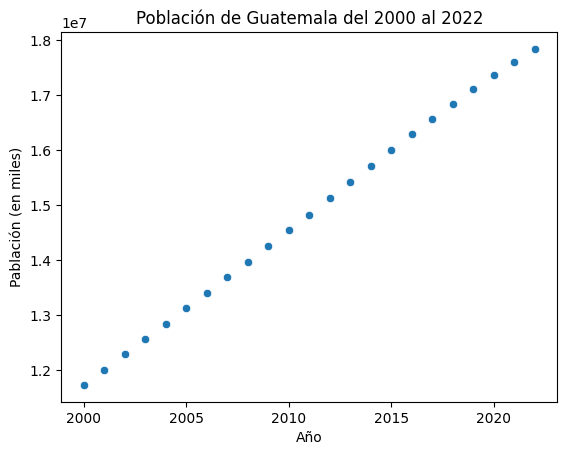

In [200]:
sns.scatterplot(data=PopulationGua, x="Year", y="Population")

plt.title("Población de Guatemala del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

In [201]:
# Extraer el año y la población de ArgDf
years = GuaDf['Year'].values.reshape(-1, 1)
population = GuaDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationGua = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationGua.round()

array([18220644., 18502731., 18784818., 19066904., 19348991., 19631078.,
       19913164., 20195251., 20477338., 20759425., 21041511., 21323598.,
       21605685., 21887771., 22169858., 22451945., 22734031., 23016118.,
       23298205., 23580291., 23862378., 24144465., 24426552., 24708638.,
       24990725., 25272812., 25554898., 25836985.])

In [202]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población
data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationGua.round()}

GuaTotal = pd.DataFrame(data)
GuaTotal['TDKcal'] = GuaTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
GuaTotal

,Year,Population,TDKcal
0,2023,18220644.0,1.330107e+13
1,2024,18502731.0,1.350699e+13
2,2025,18784818.0,1.371292e+13
3,2026,19066904.0,1.391884e+13
4,2027,19348991.0,1.412476e+13
5,2028,19631078.0,1.433069e+13
6,2029,19913164.0,1.453661e+13
7,2030,20195251.0,1.474253e+13
8,2031,20477338.0,1.494846e+13
9,2032,20759425.0,1.515438e+13


In [203]:
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = GuaDf[GuaDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

GuaDemandproduction = pd.DataFrame(data)
GuaDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,Buckwheat,0,0,"Cereals, primary"
1,2000,"Agave fibres, raw, n.e.c.",449500000,145,Fibre Crops Primary
2,2000,Sweet potatoes,450000000,500,"Roots and Tubers, Total"
3,2000,Barley,1784730000,1451,"Cereals, primary"
4,2000,Cocoa beans,5139200000,2336,Agriculture
...,...,...,...,...,...
537,2022,Cocoa beans,2565611400000,1166187,Agriculture
538,2022,Avocados,2223417600000,1389636,Vegetables and Fruit Primary
539,2022,Strawberries,447279680000,1397749,Vegetables and Fruit Primary
540,2022,"Coconuts, in shell",5218027260000,1474019,Oilcrops Primary


In [204]:
alt.Chart(GuaDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [205]:
data = []

for year in range(2023, 2051):
  target_kcal = GuaTotal[GuaTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(GuaDemandproduction) - 1)
    item = GuaDemandproduction.iloc[random_index]['Item']
    kcal = GuaDemandproduction.iloc[random_index]['TPKcal']

    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break
  data.append({'Year': year, 'Items': items})

result_df = pd.DataFrame(data)
result_df_transformed_Gua = result_df.explode('Items')
result_df_transformed_Gua['TPKcal'] = result_df_transformed_Gua.apply(lambda row: GuaDemandproduction[GuaDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Gua['Production'] = result_df_transformed_Gua.apply(lambda row: GuaDemandproduction[GuaDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Gua['Item Group'] = result_df_transformed_Gua.apply(lambda row: GuaDemandproduction[GuaDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Gua

,Year,Items,TPKcal,Production,Item Group
0,2023,Cantaloupes and other melons,52164000000,186300,Vegetables and Fruit Primary
0,2023,"Coconuts, in shell",159300000000,45000,Oilcrops Primary
0,2023,"Onions and shallots, dry (excluding dehydrated)",365682200000,104780,Vegetables and Fruit Primary
0,2023,"Chillies and peppers, green (Capsicum spp. and...",6264000000,21600,Vegetables and Fruit Primary
0,2023,Wheat,12573000000,9525,"Cereals, primary"
...,...,...,...,...,...
27,2050,Strawberries,2104640000,6577,Vegetables and Fruit Primary
27,2050,"Pepper (Piper spp.), raw",12300640000,42416,Agriculture
27,2050,Potatoes,171425260000,216994,"Roots and Tubers, Total"
27,2050,Soya beans,44007390000,29937,Oilcrops Primary


In [206]:
alt.Chart(result_df_transformed_Gua).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# Guyana - No Evaluar

In [207]:
GuyDf = NewDf[NewDf['Country'] == 'Guyana']
GuyDf = GuyDf[GuyDf['Item Group'] != 'Sugar Crops Primary']
GuyDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
546,328,Guyana,2000,Oilcrops Primary,Soya beans,0,147,11.05,12.95,6.80,759051,0.0,0.0,0.0,0,554107230000,55410723000,41558042250,18562592205
547,328,Guyana,2000,Vegetables and Fruit Primary,"Onions and shallots, green",0,40,9.34,1.10,0.10,759051,0.0,0.0,0.0,0,554107230000,55410723000,41558042250,18562592205
548,328,Guyana,2000,Agriculture,"Coffee, green",15,1,0.00,0.12,0.02,759051,0.0,18000.0,3000.0,150000,554107230000,55410723000,41558042250,18562592205
549,328,Guyana,2000,Vegetables and Fruit Primary,Watermelons,66,30,7.55,0.61,0.15,759051,4983000.0,402600.0,99000.0,19800000,554107230000,55410723000,41558042250,18562592205
550,328,Guyana,2000,Agriculture,"Pepper (Piper spp.), raw",200,29,6.70,0.80,0.41,759051,13400000.0,1600000.0,820000.0,58000000,554107230000,55410723000,41558042250,18562592205


In [208]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationGuy = GuyDf.groupby('Year',)['Population'].mean()
PopulationGuy = pd.DataFrame(PopulationGuy)
PopulationGuy = PopulationGuy.reset_index()
PopulationGuy.columns = ['Year', 'Population']
PopulationGuy

,Year,Population
0,2000,759051.0
1,2001,759809.0
2,2002,760323.0
3,2003,760562.0
4,2004,760424.0
5,2005,759709.0
6,2006,758367.0
7,2007,756521.0
8,2008,754150.0
9,2009,751258.0


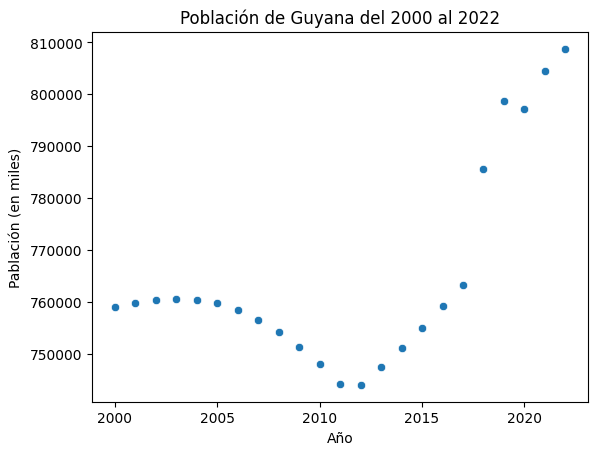

In [209]:
sns.scatterplot(data=PopulationGuy, x="Year", y="Population")

plt.title("Población de Guyana del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

Teniendo en consideración los resultados del volumen de población obtenido de la fuente de datos y que estos no están representados por una regreción lineal se descarta a Guyana de la base de avaluación

# Honduras

In [216]:
HonDf = NewDf[NewDf['Country'] == 'Honduras']
HonDf = HonDf[HonDf['Item Group'] != 'Sugar Crops Primary']
HonDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
581,340,Honduras,2000,Vegetables and Fruit Primary,Green garlic,90,149,33.06,6.36,0.50,6656725,29754000.0,5724000.0,450000.0,134100000,4859409250000,485940925000,364455693750,162790209875
582,340,Honduras,2000,Agriculture,"Nutmeg, mace, cardamoms, raw",330,525,49.29,5.84,36.31,6656725,162657000.0,19272000.0,119823000.0,1732500000,4859409250000,485940925000,364455693750,162790209875
583,340,Honduras,2000,Vegetables and Fruit Primary,Cauliflowers and broccoli,665,34,6.64,2.82,0.37,6656725,44156000.0,18753000.0,2460500.0,226100000,4859409250000,485940925000,364455693750,162790209875
584,340,Honduras,2000,Oilcrops Primary,Sesame seed,700,565,25.74,16.96,48.00,6656725,180180000.0,118720000.0,336000000.0,3955000000,4859409250000,485940925000,364455693750,162790209875
585,340,Honduras,2000,Vegetables and Fruit Primary,Avocados,750,160,8.53,2.00,14.66,6656725,63975000.0,15000000.0,109950000.0,1200000000,4859409250000,485940925000,364455693750,162790209875


In [217]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationHon = HonDf.groupby('Year',)['Population'].mean()
PopulationHon = pd.DataFrame(PopulationHon)
PopulationHon = PopulationHon.reset_index()
PopulationHon.columns = ['Year', 'Population']
PopulationHon

,Year,Population
0,2000,6656725.0
1,2001,6837861.0
2,2002,7019908.0
3,2003,7201881.0
4,2004,7383407.0
5,2005,7564613.0
6,2006,7745200.0
7,2007,7924462.0
8,2008,8101777.0
9,2009,8277302.0


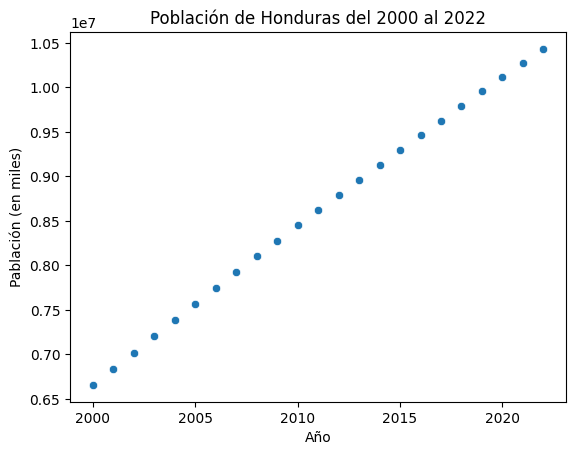

In [218]:
sns.scatterplot(data=PopulationHon, x="Year", y="Population")

plt.title("Población de Honduras del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

In [219]:
# Extraer el año y la población de ArgDf
years = HonDf['Year'].values.reshape(-1, 1)
population = HonDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationHon = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationHon.round()

array([10655659., 10827571., 10999482., 11171394., 11343306., 11515218.,
       11687129., 11859041., 12030953., 12202864., 12374776., 12546688.,
       12718600., 12890511., 13062423., 13234335., 13406247., 13578158.,
       13750070., 13921982., 14093893., 14265805., 14437717., 14609629.,
       14781540., 14953452., 15125364., 15297276.])

In [220]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población
data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationHon.round()}

HonTotal = pd.DataFrame(data)
HonTotal['TDKcal'] = HonTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
HonTotal

,Year,Population,TDKcal
0,2023,10655659.0,7.778631e+12
1,2024,10827571.0,7.904127e+12
2,2025,10999482.0,8.029622e+12
3,2026,11171394.0,8.155118e+12
4,2027,11343306.0,8.280613e+12
5,2028,11515218.0,8.406109e+12
6,2029,11687129.0,8.531604e+12
7,2030,11859041.0,8.657100e+12
8,2031,12030953.0,8.782596e+12
9,2032,12202864.0,8.908091e+12


In [221]:
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = HonDf[HonDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

HonDemandproduction = pd.DataFrame(data)
HonDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,Green garlic,134100000,90,Vegetables and Fruit Primary
1,2000,"Nutmeg, mace, cardamoms, raw",1732500000,330,Agriculture
2,2000,Cauliflowers and broccoli,226100000,665,Vegetables and Fruit Primary
3,2000,Sesame seed,3955000000,700,Oilcrops Primary
4,2000,Avocados,1200000000,750,Vegetables and Fruit Primary
...,...,...,...,...,...
782,2022,Avocados,351784000000,219865,Vegetables and Fruit Primary
783,2022,Carrots and turnips,192987820000,470702,Vegetables and Fruit Primary
784,2022,Edible roots and tubers with high starch or in...,127033720000,577426,"Roots and Tubers, Total"
785,2022,Taro,808708320000,722061,"Roots and Tubers, Total"


In [222]:
alt.Chart(HonDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [223]:
data = []

for year in range(2023, 2051):
  target_kcal = HonTotal[HonTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(HonDemandproduction) - 1)
    item = HonDemandproduction.iloc[random_index]['Item']
    kcal = HonDemandproduction.iloc[random_index]['TPKcal']

    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break
  data.append({'Year': year, 'Items': items})

result_df = pd.DataFrame(data)
result_df_transformed_Hon = result_df.explode('Items')
result_df_transformed_Hon['TPKcal'] = result_df_transformed_Hon.apply(lambda row: HonDemandproduction[HonDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Hon['Production'] = result_df_transformed_Hon.apply(lambda row: HonDemandproduction[HonDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Hon['Item Group'] = result_df_transformed_Hon.apply(lambda row: HonDemandproduction[HonDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Hon

,Year,Items,TPKcal,Production,Item Group
0,2023,"Cassava, fresh",15966400000,9979,"Roots and Tubers, Total"
0,2023,"Coffee, green",1933090000,193309,Agriculture
0,2023,Wheat,138788760000,105143,"Cereals, primary"
0,2023,Sesame seed,3955000000,700,Oilcrops Primary
0,2023,Potatoes,17624900000,22310,"Roots and Tubers, Total"
...,...,...,...,...,...
27,2050,Plantains and cooking bananas,55248480000,47628,Vegetables and Fruit Primary
27,2050,"Beans, dry",89229000000,84980,Agriculture
27,2050,"Pepper (Piper spp.), raw",9950770000,34313,Agriculture
27,2050,Carrots and turnips,1435000000,3500,Vegetables and Fruit Primary


In [224]:
alt.Chart(result_df_transformed_Hon).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# Mexico

In [225]:
MexDf = NewDf[NewDf['Country'] == 'Mexico']
MexDf = MexDf[MexDf['Item Group'] != 'Sugar Crops Primary']
MexDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
623,484,Mexico,2000,Agriculture,"Cloves (whole stems), raw",0,274,65.53,5.97,13.00,97873442,0.0,0.0,0.0,0,71447612660000,7144761266000,5358570949500,2393495024110
624,484,Mexico,2000,Agriculture,"Peppermint, spearmint",0,70,14.89,3.75,0.94,97873442,0.0,0.0,0.0,0,71447612660000,7144761266000,5358570949500,2393495024110
625,484,Mexico,2000,"Cereals, primary",Rye,0,338,75.86,10.34,1.63,97873442,0.0,0.0,0.0,0,71447612660000,7144761266000,5358570949500,2393495024110
626,484,Mexico,2000,"Cereals, primary",Millet,7,119,23.37,3.51,1.00,97873442,1635900.0,245700.0,70000.0,8330000,71447612660000,7144761266000,5358570949500,2393495024110
627,484,Mexico,2000,Oilcrops Primary,Mustard seed,23,508,28.09,26.08,36.24,97873442,6460700.0,5998400.0,8335200.0,116840000,71447612660000,7144761266000,5358570949500,2393495024110


In [226]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationMex = MexDf.groupby('Year',)['Population'].mean()
PopulationMex = pd.DataFrame(PopulationMex)
PopulationMex = PopulationMex.reset_index()
PopulationMex.columns = ['Year', 'Population']
PopulationMex

,Year,Population
0,2000,97873442.0
1,2001,99394288.0
2,2002,100917081.0
3,2003,102429341.0
4,2004,103945813.0
5,2005,105442402.0
6,2006,106886790.0
7,2007,108302973.0
8,2008,109684489.0
9,2009,111049428.0


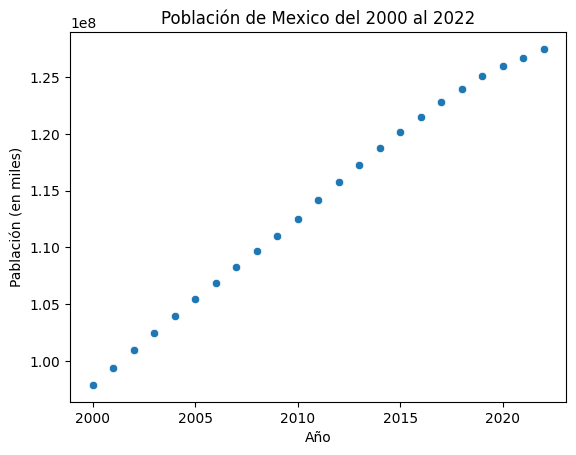

In [227]:
sns.scatterplot(data=PopulationMex, x="Year", y="Population")

plt.title("Población de Mexico del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

In [228]:
# Extraer el año y la población de ArgDf
years = MexDf['Year'].values.reshape(-1, 1)
population = MexDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationMex = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationMex.round()

array([1.30606912e+08, 1.32004493e+08, 1.33402074e+08, 1.34799656e+08,
       1.36197237e+08, 1.37594818e+08, 1.38992400e+08, 1.40389981e+08,
       1.41787562e+08, 1.43185144e+08, 1.44582725e+08, 1.45980306e+08,
       1.47377888e+08, 1.48775469e+08, 1.50173050e+08, 1.51570632e+08,
       1.52968213e+08, 1.54365794e+08, 1.55763376e+08, 1.57160957e+08,
       1.58558538e+08, 1.59956120e+08, 1.61353701e+08, 1.62751282e+08,
       1.64148864e+08, 1.65546445e+08, 1.66944026e+08, 1.68341608e+08])

In [229]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población
data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationMex.round()}

MexTotal = pd.DataFrame(data)
MexTotal['TDKcal'] = MexTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
MexTotal

,Year,Population,TDKcal
0,2023,130606912.0,9.534305e+13
1,2024,132004493.0,9.636328e+13
2,2025,133402074.0,9.738351e+13
3,2026,134799656.0,9.840375e+13
4,2027,136197237.0,9.942398e+13
5,2028,137594818.0,1.004442e+14
6,2029,138992400.0,1.014645e+14
7,2030,140389981.0,1.024847e+14
8,2031,141787562.0,1.035049e+14
9,2032,143185144.0,1.045252e+14


In [230]:
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = MexDf[MexDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

MexDemandproduction = pd.DataFrame(data)
MexDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,"Cloves (whole stems), raw",0,0,Agriculture
1,2000,"Peppermint, spearmint",0,0,Agriculture
2,2000,Rye,0,0,"Cereals, primary"
3,2000,Millet,8330000,7,"Cereals, primary"
4,2000,Mustard seed,116840000,23,Oilcrops Primary
...,...,...,...,...,...
1461,2022,Okra,1300525380000,3940986,Vegetables and Fruit Primary
1462,2022,Yautia,4657630320000,4752684,"Roots and Tubers, Total"
1463,2022,Spinach,1165062240000,5065488,Vegetables and Fruit Primary
1464,2022,Sesame seed,31817161400000,5631356,Oilcrops Primary


In [231]:
alt.Chart(MexDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [232]:
data = []

for year in range(2023, 2051):
  target_kcal = MexTotal[MexTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(MexDemandproduction) - 1)
    item = MexDemandproduction.iloc[random_index]['Item']
    kcal = MexDemandproduction.iloc[random_index]['TPKcal']

    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break
  data.append({'Year': year, 'Items': items})

result_df = pd.DataFrame(data)
result_df_transformed_Mex = result_df.explode('Items')
result_df_transformed_Mex['TPKcal'] = result_df_transformed_Mex.apply(lambda row: MexDemandproduction[MexDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Mex['Production'] = result_df_transformed_Mex.apply(lambda row: MexDemandproduction[MexDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Mex['Item Group'] = result_df_transformed_Mex.apply(lambda row: MexDemandproduction[MexDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Mex

,Year,Items,TPKcal,Production,Item Group
0,2023,Okra,13907190000,42143,Vegetables and Fruit Primary
0,2023,"Tangerines, mandarins, clementines",166191040000,313568,Vegetables and Fruit Primary
0,2023,Cocoa beans,61701200000,28046,Agriculture
0,2023,Pomelos and grapefruits,99987880000,263126,Vegetables and Fruit Primary
0,2023,Eggplants (aubergines),14750000000,59000,Vegetables and Fruit Primary
...,...,...,...,...,...
27,2050,Sunflower seed,408800000,70,Oilcrops Primary
27,2050,Artichokes,1404360000,2988,Vegetables and Fruit Primary
27,2050,Pineapples,261211000000,522422,Vegetables and Fruit Primary
27,2050,Mustard seed,116840000,23,Oilcrops Primary


In [233]:
alt.Chart(result_df_transformed_Mex).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# Nicaragua

In [234]:
NicDf = NewDf[NewDf['Country'] == 'Nicaragua']
NicDf = NicDf[NicDf['Item Group'] != 'Sugar Crops Primary']
NicDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
706,558,Nicaragua,2000,Agriculture,Cocoa beans,250,220,58.30,18.10,13.10,5123222,1.457500e+08,45250000.0,3.275000e+07,550000000,3739952060000,373995206000,280496404500,125288394010
707,558,Nicaragua,2000,"Roots and Tubers, Total",Yams,1000,116,27.48,1.49,0.14,5123222,2.748000e+08,14900000.0,1.400000e+06,1160000000,3739952060000,373995206000,280496404500,125288394010
708,558,Nicaragua,2000,Oilcrops Primary,Sesame seed,4246,565,25.74,16.96,48.00,5123222,1.092920e+09,720121600.0,2.038080e+09,23989900000,3739952060000,373995206000,280496404500,125288394010
709,558,Nicaragua,2000,Oilcrops Primary,"Coconuts, in shell",5000,354,15.23,3.33,33.49,5123222,7.615000e+08,166500000.0,1.674500e+09,17700000000,3739952060000,373995206000,280496404500,125288394010
710,558,Nicaragua,2000,"Roots and Tubers, Total",Edible roots and tubers with high starch or in...,5000,22,3.26,3.09,0.34,5123222,1.630000e+08,154500000.0,1.700000e+07,1100000000,3739952060000,373995206000,280496404500,125288394010


In [235]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationNic = NicDf.groupby('Year',)['Population'].mean()
PopulationNic = pd.DataFrame(PopulationNic)
PopulationNic = PopulationNic.reset_index()
PopulationNic.columns = ['Year', 'Population']
PopulationNic

,Year,Population
0,2000,5123222.0
1,2001,5192764.0
2,2002,5259006.0
3,2003,5323062.0
4,2004,5386223.0
5,2005,5454678.0
6,2006,5529811.0
7,2007,5607453.0
8,2008,5687744.0
9,2009,5770639.0


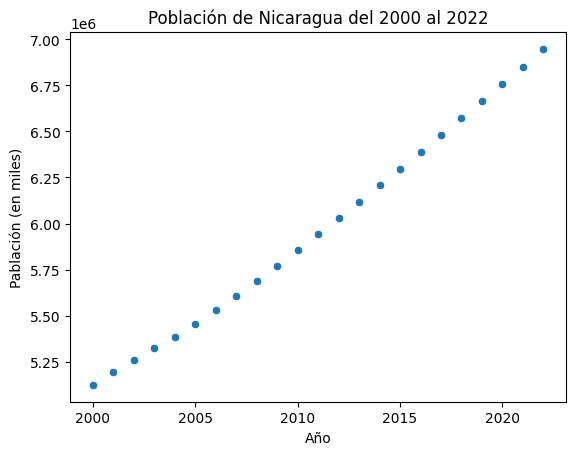

In [236]:
sns.scatterplot(data=PopulationNic, x="Year", y="Population")

plt.title("Población de Nicaragua del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

In [237]:
# Extraer el año y la población de ArgDf
years = NicDf['Year'].values.reshape(-1, 1)
population = NicDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationNic = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationNic.round()

array([6981749., 7065551., 7149353., 7233155., 7316957., 7400759.,
       7484561., 7568363., 7652165., 7735967., 7819769., 7903571.,
       7987373., 8071175., 8154977., 8238779., 8322581., 8406383.,
       8490184., 8573986., 8657788., 8741590., 8825392., 8909194.,
       8992996., 9076798., 9160600., 9244402.])

In [238]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población
data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationNic.round()}

NicTotal = pd.DataFrame(data)
NicTotal['TDKcal'] = NicTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
NicTotal

,Year,Population,TDKcal
0,2023,6981749.0,5.096677e+12
1,2024,7065551.0,5.157852e+12
2,2025,7149353.0,5.219028e+12
3,2026,7233155.0,5.280203e+12
4,2027,7316957.0,5.341379e+12
5,2028,7400759.0,5.402554e+12
6,2029,7484561.0,5.463730e+12
7,2030,7568363.0,5.524905e+12
8,2031,7652165.0,5.586080e+12
9,2032,7735967.0,5.647256e+12


In [239]:
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = NicDf[NicDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

NicDemandproduction = pd.DataFrame(data)
NicDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,Cocoa beans,550000000,250,Agriculture
1,2000,Yams,1160000000,1000,"Roots and Tubers, Total"
2,2000,Sesame seed,23989900000,4246,Oilcrops Primary
3,2000,"Coconuts, in shell",17700000000,5000,Oilcrops Primary
4,2000,Edible roots and tubers with high starch or in...,1100000000,5000,"Roots and Tubers, Total"
...,...,...,...,...,...
365,2022,Yams,1160000000,1000,"Roots and Tubers, Total"
366,2022,Soya beans,14700000000,10000,Oilcrops Primary
367,2022,Sesame seed,2184244800000,386592,Oilcrops Primary
368,2022,"Agave fibres, raw, n.e.c.",1682317300000,542683,Fibre Crops Primary


In [240]:
alt.Chart(NicDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [241]:
data = []

for year in range(2023, 2051):
  target_kcal = NicTotal[NicTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(NicDemandproduction) - 1)
    item = NicDemandproduction.iloc[random_index]['Item']
    kcal = NicDemandproduction.iloc[random_index]['TPKcal']

    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break
  data.append({'Year': year, 'Items': items})

result_df = pd.DataFrame(data)
result_df_transformed_Nic = result_df.explode('Items')
result_df_transformed_Nic['TPKcal'] = result_df_transformed_Nic.apply(lambda row: NicDemandproduction[NicDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Nic['Production'] = result_df_transformed_Nic.apply(lambda row: NicDemandproduction[NicDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Nic['Item Group'] = result_df_transformed_Nic.apply(lambda row: NicDemandproduction[NicDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Nic

,Year,Items,TPKcal,Production,Item Group
0,2023,"Chillies and peppers, green (Capsicum spp. and...",5223480000,18012,Vegetables and Fruit Primary
0,2023,Oil palm fruit,468520000000,53000,Oilcrops Primary
0,2023,Yams,1160000000,1000,"Roots and Tubers, Total"
0,2023,Rice,376480000000,289600,"Cereals, primary"
0,2023,"Agave fibres, raw, n.e.c.",1278126900000,412299,Fibre Crops Primary
...,...,...,...,...,...
27,2050,Yams,1160000000,1000,"Roots and Tubers, Total"
27,2050,Yams,1160000000,1000,"Roots and Tubers, Total"
27,2050,Plantains and cooking bananas,46400000000,40000,Vegetables and Fruit Primary
27,2050,Taro,625636480000,558604,"Roots and Tubers, Total"


In [242]:
alt.Chart(result_df_transformed_Nic).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# Panama

In [243]:
PanDf = NewDf[NewDf['Country'] == 'Panama']
PanDf = PanDf[PanDf['Item Group'] != 'Sugar Crops Primary']
PanDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
732,591,Panama,2000,Agriculture,Cocoa beans,593,220,58.30,18.10,13.10,3001731,345719000.0,107333000.0,77683000.0,1304600000,2191263630000,219126363000,164344772250,73407331605
733,591,Panama,2000,"Roots and Tubers, Total",Edible roots and tubers with high starch or in...,1871,22,3.26,3.09,0.34,3001731,60994600.0,57813900.0,6361400.0,411620000,2191263630000,219126363000,164344772250,73407331605
734,591,Panama,2000,Vegetables and Fruit Primary,Cucumbers and gherkins,1891,15,3.63,0.65,0.11,3001731,68643300.0,12291500.0,2080100.0,283650000,2191263630000,219126363000,164344772250,73407331605
735,591,Panama,2000,Agriculture,"Pigeon peas, dry",1908,121,23.25,6.76,0.38,3001731,443610000.0,128980800.0,7250400.0,2308680000,2191263630000,219126363000,164344772250,73407331605
736,591,Panama,2000,Vegetables and Fruit Primary,Cabbages,2505,25,5.80,1.28,0.10,3001731,145290000.0,32064000.0,2505000.0,626250000,2191263630000,219126363000,164344772250,73407331605


In [244]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationPan = PanDf.groupby('Year',)['Population'].mean()
PopulationPan = pd.DataFrame(PopulationPan)
PopulationPan = PopulationPan.reset_index()
PopulationPan.columns = ['Year', 'Population']
PopulationPan

,Year,Population
0,2000,3001731.0
1,2001,3061024.0
2,2002,3120990.0
3,2003,3181608.0
4,2004,3243311.0
5,2005,3305868.0
6,2006,3368573.0
7,2007,3431614.0
8,2008,3495276.0
9,2009,3559343.0


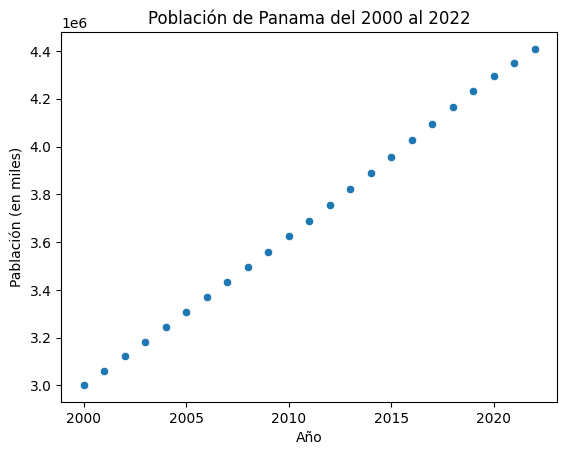

In [245]:
sns.scatterplot(data=PopulationPan, x="Year", y="Population")

plt.title("Población de Panama del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

In [246]:
# Extraer el año y la población de ArgDf
years = PanDf['Year'].values.reshape(-1, 1)
population = PanDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationPan = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationPan.round()

array([4479495., 4544516., 4609536., 4674557., 4739578., 4804599.,
       4869619., 4934640., 4999661., 5064682., 5129702., 5194723.,
       5259744., 5324765., 5389785., 5454806., 5519827., 5584847.,
       5649868., 5714889., 5779910., 5844930., 5909951., 5974972.,
       6039993., 6105013., 6170034., 6235055.])

In [247]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población
data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationPan.round()}

PanTotal = pd.DataFrame(data)
PanTotal['TDKcal'] = PanTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
PanTotal

,Year,Population,TDKcal
0,2023,4479495.0,3.270031e+12
1,2024,4544516.0,3.317497e+12
2,2025,4609536.0,3.364961e+12
3,2026,4674557.0,3.412427e+12
4,2027,4739578.0,3.459892e+12
5,2028,4804599.0,3.507357e+12
6,2029,4869619.0,3.554822e+12
7,2030,4934640.0,3.602287e+12
8,2031,4999661.0,3.649753e+12
9,2032,5064682.0,3.697218e+12


In [248]:
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = PanDf[PanDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

PanDemandproduction = pd.DataFrame(data)
PanDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,Cocoa beans,1304600000,593,Agriculture
1,2000,Edible roots and tubers with high starch or in...,411620000,1871,"Roots and Tubers, Total"
2,2000,Cucumbers and gherkins,283650000,1891,Vegetables and Fruit Primary
3,2000,"Pigeon peas, dry",2308680000,1908,Agriculture
4,2000,Cabbages,626250000,2505,Vegetables and Fruit Primary
...,...,...,...,...,...
715,2022,Cantaloupes and other melons,160381480000,572791,Vegetables and Fruit Primary
716,2022,Cucumbers and gherkins,86408400000,576056,Vegetables and Fruit Primary
717,2022,"Beans, dry",636477450000,606169,Agriculture
718,2022,"Chillies and peppers, green (Capsicum spp. and...",214719480000,740412,Vegetables and Fruit Primary


In [249]:
alt.Chart(PanDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [250]:
data = []

for year in range(2023, 2051):
  target_kcal = PanTotal[PanTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(PanDemandproduction) - 1)
    item = PanDemandproduction.iloc[random_index]['Item']
    kcal = PanDemandproduction.iloc[random_index]['TPKcal']

    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break
  data.append({'Year': year, 'Items': items})

result_df = pd.DataFrame(data)
result_df_transformed_Pan = result_df.explode('Items')
result_df_transformed_Pan['TPKcal'] = result_df_transformed_Pan.apply(lambda row: PanDemandproduction[PanDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Pan['Production'] = result_df_transformed_Pan.apply(lambda row: PanDemandproduction[PanDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Pan['Item Group'] = result_df_transformed_Pan.apply(lambda row: PanDemandproduction[PanDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Pan

,Year,Items,TPKcal,Production,Item Group
0,2023,"Onions and shallots, dry (excluding dehydrated)",18859960000,5404,Vegetables and Fruit Primary
0,2023,"Beans, dry",4078200000,3884,Agriculture
0,2023,Tomatoes,3360240000,18668,Vegetables and Fruit Primary
0,2023,Soya beans,13890030000,9449,Oilcrops Primary
0,2023,"Pigeon peas, dry",2308680000,1908,Agriculture
...,...,...,...,...,...
27,2050,"Pigeon peas, dry",2308680000,1908,Agriculture
27,2050,Yautia,5775140000,5893,"Roots and Tubers, Total"
27,2050,Yams,18957880000,16343,"Roots and Tubers, Total"
27,2050,Maize (corn),304578000000,84605,"Cereals, primary"


In [251]:
alt.Chart(result_df_transformed_Pan).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# Paraguay

In [252]:
ParDf = NewDf[NewDf['Country'] == 'Paraguay']
ParDf = ParDf[ParDf['Item Group'] != 'Sugar Crops Primary']
ParDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
764,600,Paraguay,2000,Vegetables and Fruit Primary,Green garlic,891,149,33.06,6.36,0.50,5123819,2.945646e+08,56667600.0,4455000.0,1327590000,3740387870000,374038787000,280529090250,125302993645
765,600,Paraguay,2000,"Roots and Tubers, Total",Potatoes,986,79,18.07,2.14,0.08,5123819,1.781702e+08,21100400.0,788800.0,778940000,3740387870000,374038787000,280529090250,125302993645
766,600,Paraguay,2000,Vegetables and Fruit Primary,Strawberries,1843,32,7.68,0.67,0.30,5123819,1.415424e+08,12348100.0,5529000.0,589760000,3740387870000,374038787000,280529090250,125302993645
767,600,Paraguay,2000,Agriculture,"Coffee, green",3586,1,0.00,0.12,0.02,5123819,0.000000e+00,4303200.0,717200.0,35860000,3740387870000,374038787000,280529090250,125302993645
768,600,Paraguay,2000,Vegetables and Fruit Primary,Grapes,7804,67,17.15,0.63,0.35,5123819,1.338386e+09,49165200.0,27314000.0,5228680000,3740387870000,374038787000,280529090250,125302993645


In [253]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationPar = ParDf.groupby('Year',)['Population'].mean()
PopulationPar = pd.DataFrame(PopulationPar)
PopulationPar = PopulationPar.reset_index()
PopulationPar.columns = ['Year', 'Population']
PopulationPar

,Year,Population
0,2000,5123819.0
1,2001,5211541.0
2,2002,5286512.0
3,2003,5353254.0
4,2004,5416324.0
5,2005,5476878.0
6,2006,5534675.0
7,2007,5590145.0
8,2008,5645148.0
9,2009,5702574.0


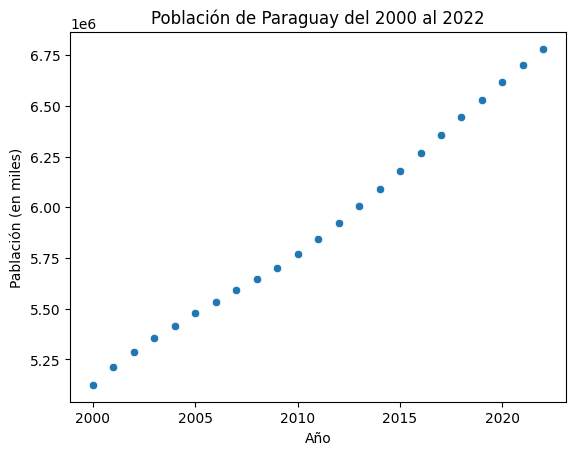

In [254]:
sns.scatterplot(data=PopulationPar, x="Year", y="Population")

plt.title("Población de Paraguay del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

In [255]:
# Extraer el año y la población de ArgDf
years = ParDf['Year'].values.reshape(-1, 1)
population = ParDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationPar = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationPar.round()

array([6797274., 6871504., 6945735., 7019965., 7094196., 7168426.,
       7242657., 7316887., 7391118., 7465348., 7539579., 7613809.,
       7688040., 7762270., 7836501., 7910731., 7984962., 8059192.,
       8133423., 8207653., 8281884., 8356114., 8430345., 8504575.,
       8578806., 8653036., 8727267., 8801497.])

In [256]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población
data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationPar.round()}

ParTotal = pd.DataFrame(data)
ParTotal['TDKcal'] = ParTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
ParTotal

,Year,Population,TDKcal
0,2023,6797274.0,4.962010e+12
1,2024,6871504.0,5.016198e+12
2,2025,6945735.0,5.070387e+12
3,2026,7019965.0,5.124574e+12
4,2027,7094196.0,5.178763e+12
5,2028,7168426.0,5.232951e+12
6,2029,7242657.0,5.287140e+12
7,2030,7316887.0,5.341328e+12
8,2031,7391118.0,5.395516e+12
9,2032,7465348.0,5.449704e+12


In [257]:
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = ParDf[ParDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

ParDemandproduction = pd.DataFrame(data)
ParDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,Green garlic,1327590000,891,Vegetables and Fruit Primary
1,2000,Potatoes,778940000,986,"Roots and Tubers, Total"
2,2000,Strawberries,589760000,1843,Vegetables and Fruit Primary
3,2000,"Coffee, green",35860000,3586,Agriculture
4,2000,Grapes,5228680000,7804,Vegetables and Fruit Primary
...,...,...,...,...,...
670,2022,Strawberries,124078400000,387745,Vegetables and Fruit Primary
671,2022,Wheat,983334000000,744950,"Cereals, primary"
672,2022,Carrots and turnips,345381950000,842395,Vegetables and Fruit Primary
673,2022,Rice,1119950000000,861500,"Cereals, primary"


In [258]:
alt.Chart(ParDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [259]:
data = []

for year in range(2023, 2051):
  target_kcal = ParTotal[ParTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(ParDemandproduction) - 1)
    item = ParDemandproduction.iloc[random_index]['Item']
    kcal = ParDemandproduction.iloc[random_index]['TPKcal']

    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break
  data.append({'Year': year, 'Items': items})

result_df = pd.DataFrame(data)
result_df_transformed_Par = result_df.explode('Items')
result_df_transformed_Par['TPKcal'] = result_df_transformed_Par.apply(lambda row: ParDemandproduction[ParDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Par['Production'] = result_df_transformed_Par.apply(lambda row: ParDemandproduction[ParDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Par['Item Group'] = result_df_transformed_Par.apply(lambda row: ParDemandproduction[ParDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Par

,Year,Items,TPKcal,Production,Item Group
0,2023,Lemons and limes,3067620000,10578,Vegetables and Fruit Primary
0,2023,Grapes,5228680000,7804,Vegetables and Fruit Primary
0,2023,Green garlic,1327590000,891,Vegetables and Fruit Primary
0,2023,Papayas,5160000000,12000,Vegetables and Fruit Primary
0,2023,Pomelos and grapefruits,18190980000,47871,Vegetables and Fruit Primary
...,...,...,...,...,...
27,2050,Plums and sloes,70920040000,154174,Vegetables and Fruit Primary
27,2050,Pears,11959170000,20981,Vegetables and Fruit Primary
27,2050,"Onions and shallots, dry (excluding dehydrated)",118660000000,34000,Vegetables and Fruit Primary
27,2050,"Coffee, green",35860000,3586,Agriculture


In [260]:
alt.Chart(result_df_transformed_Par).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# Peru

In [261]:
PerDf = NewDf[NewDf['Country'] == 'Peru']
PerDf = PerDf[PerDf['Item Group'] != 'Sugar Crops Primary']
PerDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
801,604,Peru,2000,Agriculture,"Almonds, in shell",0,579,21.55,21.15,49.93,26654439,0.0,0.0,0.0,0,19457740470000,1945774047000,1459330535250,651834305745
802,604,Peru,2000,Agriculture,"Ginger, raw",0,80,17.77,1.82,0.75,26654439,0.0,0.0,0.0,0,19457740470000,1945774047000,1459330535250,651834305745
803,604,Peru,2000,Agriculture,"Pepper (Piper spp.), raw",0,29,6.70,0.80,0.41,26654439,0.0,0.0,0.0,0,19457740470000,1945774047000,1459330535250,651834305745
804,604,Peru,2000,Vegetables and Fruit Primary,Bananas,0,89,22.24,1.09,0.33,26654439,0.0,0.0,0.0,0,19457740470000,1945774047000,1459330535250,651834305745
805,604,Peru,2000,Vegetables and Fruit Primary,Blueberries,0,57,14.49,0.74,0.33,26654439,0.0,0.0,0.0,0,19457740470000,1945774047000,1459330535250,651834305745


In [262]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationPer = PerDf.groupby('Year',)['Population'].mean()
PopulationPer = pd.DataFrame(PopulationPer)
PopulationPer = PopulationPer.reset_index()
PopulationPer.columns = ['Year', 'Population']
PopulationPer

,Year,Population
0,2000,26654439.0
1,2001,27014909.0
2,2002,27334503.0
3,2003,27623341.0
4,2004,27893911.0
5,2005,28147267.0
6,2006,28381078.0
7,2007,28600387.0
8,2008,28806185.0
9,2009,29009326.0


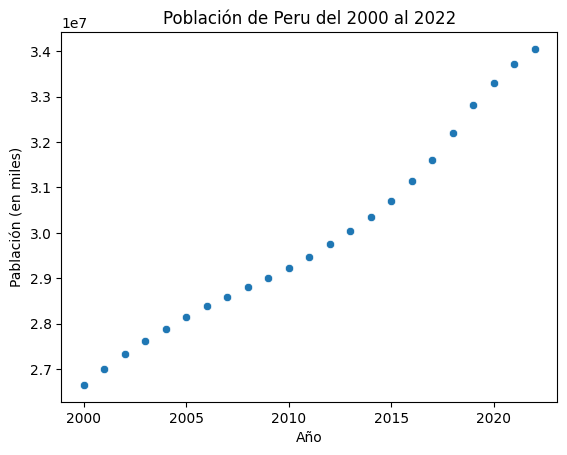

In [263]:
sns.scatterplot(data=PopulationPer, x="Year", y="Population")

plt.title("Población de Peru del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

In [264]:
# Extraer el año y la población de ArgDf
years = PerDf['Year'].values.reshape(-1, 1)
population = PerDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationPer = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationPer.round()

array([33749686., 34069891., 34390095., 34710300., 35030505., 35350709.,
       35670914., 35991118., 36311323., 36631528., 36951732., 37271937.,
       37592141., 37912346., 38232551., 38552755., 38872960., 39193164.,
       39513369., 39833574., 40153778., 40473983., 40794187., 41114392.,
       41434597., 41754801., 42075006., 42395210.])

In [265]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población
data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationPer.round()}

PerTotal = pd.DataFrame(data)
PerTotal['TDKcal'] = PerTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
PerTotal

,Year,Population,TDKcal
0,2023,33749686.0,2.463727e+13
1,2024,34069891.0,2.487102e+13
2,2025,34390095.0,2.510477e+13
3,2026,34710300.0,2.533852e+13
4,2027,35030505.0,2.557227e+13
5,2028,35350709.0,2.580602e+13
6,2029,35670914.0,2.603977e+13
7,2030,35991118.0,2.627352e+13
8,2031,36311323.0,2.650727e+13
9,2032,36631528.0,2.674102e+13


In [266]:
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = PerDf[PerDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

PerDemandproduction = pd.DataFrame(data)
PerDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,"Almonds, in shell",0,0,Agriculture
1,2000,"Ginger, raw",0,0,Agriculture
2,2000,"Pepper (Piper spp.), raw",0,0,Agriculture
3,2000,Bananas,0,0,Vegetables and Fruit Primary
4,2000,Blueberries,0,0,Vegetables and Fruit Primary
...,...,...,...,...,...
1412,2022,"Brazil nuts, in shell",4671479660000,708874,Agriculture
1413,2022,Lupins,1980313510000,1664129,Agriculture
1414,2022,Leeks and other alliaceous vegetables,1074793160000,1761956,Vegetables and Fruit Primary
1415,2022,"Cow peas, dry",2173293640000,1873529,Agriculture


In [267]:
alt.Chart(PerDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [268]:
data = []

for year in range(2023, 2051):
  target_kcal = PerTotal[PerTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(PerDemandproduction) - 1)
    item = PerDemandproduction.iloc[random_index]['Item']
    kcal = PerDemandproduction.iloc[random_index]['TPKcal']

    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break
  data.append({'Year': year, 'Items': items})

result_df = pd.DataFrame(data)
result_df_transformed_Per = result_df.explode('Items')
result_df_transformed_Per['TPKcal'] = result_df_transformed_Per.apply(lambda row: PerDemandproduction[PerDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Per['Production'] = result_df_transformed_Per.apply(lambda row: PerDemandproduction[PerDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Per['Item Group'] = result_df_transformed_Per.apply(lambda row: PerDemandproduction[PerDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Per

,Year,Items,TPKcal,Production,Item Group
0,2023,"Coconuts, in shell",76570200000,21630,Oilcrops Primary
0,2023,Barley,228259710000,185577,"Cereals, primary"
0,2023,Avocados,133873600000,83671,Vegetables and Fruit Primary
0,2023,"Ginger, raw",0,0,Agriculture
0,2023,"Pepper (Piper spp.), raw",0,0,Agriculture
...,...,...,...,...,...
27,2050,"Brazil nuts, in shell",26360000000,4000,Agriculture
27,2050,"Pepper (Piper spp.), raw",0,0,Agriculture
27,2050,"Cashew nuts, in shell",15025010000,2717,Agriculture
27,2050,Rice,2459730000000,1892100,"Cereals, primary"


In [269]:
alt.Chart(result_df_transformed_Per).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# Suriname

In [270]:
SurDf = NewDf[NewDf['Country'] == 'Suriname']
SurDf = SurDf[SurDf['Item Group'] != 'Sugar Crops Primary']
SurDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
875,740,Suriname,2000,Vegetables and Fruit Primary,Cherries,0,50,12.18,1.00,0.30,478998,0.0,0.0,0.0,0,349668540000,34966854000,26225140500,11713896090
876,740,Suriname,2000,Agriculture,"Coffee, green",4,1,0.00,0.12,0.02,478998,0.0,4800.0,800.0,40000,349668540000,34966854000,26225140500,11713896090
877,740,Suriname,2000,Agriculture,Cocoa beans,7,220,58.30,18.10,13.10,478998,4081000.0,1267000.0,917000.0,15400000,349668540000,34966854000,26225140500,11713896090
878,740,Suriname,2000,Vegetables and Fruit Primary,Lemons and limes,15,29,9.32,1.10,0.30,478998,1398000.0,165000.0,45000.0,4350000,349668540000,34966854000,26225140500,11713896090
879,740,Suriname,2000,Oilcrops Primary,Soya beans,25,147,11.05,12.95,6.80,478998,2762500.0,3237500.0,1700000.0,36750000,349668540000,34966854000,26225140500,11713896090


In [271]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationSur = SurDf.groupby('Year',)['Population'].mean()
PopulationSur = pd.DataFrame(PopulationSur)
PopulationSur = PopulationSur.reset_index()
PopulationSur.columns = ['Year', 'Population']
PopulationSur

,Year,Population
0,2000,478998.0
1,2001,487394.0
2,2002,495666.0
3,2003,503780.0
4,2004,510572.0
5,2005,516220.0
6,2006,522023.0
7,2007,527946.0
8,2008,533938.0
9,2009,539987.0


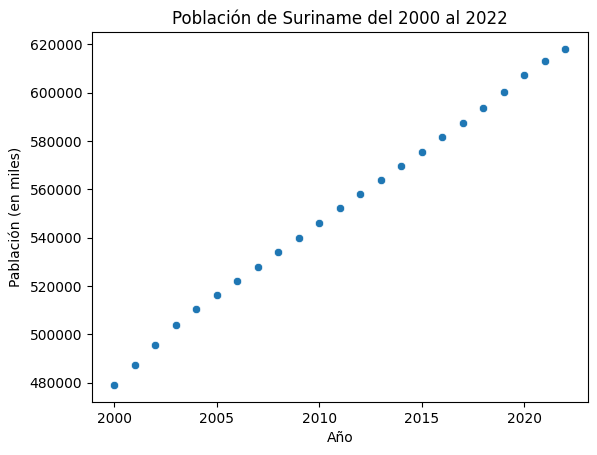

In [272]:
sns.scatterplot(data=PopulationSur, x="Year", y="Population")

plt.title("Población de Suriname del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

In [273]:
# Extraer el año y la población de ArgDf
years = SurDf['Year'].values.reshape(-1, 1)
population = SurDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationSur = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationSur.round()

array([625236., 631386., 637536., 643686., 649836., 655987., 662137.,
       668287., 674437., 680587., 686737., 692887., 699037., 705187.,
       711337., 717487., 723638., 729788., 735938., 742088., 748238.,
       754388., 760538., 766688., 772838., 778988., 785138., 791289.])

In [274]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población
data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationSur.round()}

SurTotal = pd.DataFrame(data)
SurTotal['TDKcal'] = SurTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
SurTotal

,Year,Population,TDKcal
0,2023,625236.0,4.564223e+11
1,2024,631386.0,4.609118e+11
2,2025,637536.0,4.654013e+11
3,2026,643686.0,4.698908e+11
4,2027,649836.0,4.743803e+11
5,2028,655987.0,4.788705e+11
6,2029,662137.0,4.833600e+11
7,2030,668287.0,4.878495e+11
8,2031,674437.0,4.923390e+11
9,2032,680587.0,4.968285e+11


In [275]:
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = SurDf[SurDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

SurDemandproduction = pd.DataFrame(data)
SurDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,Cherries,0,0,Vegetables and Fruit Primary
1,2000,"Coffee, green",40000,4,Agriculture
2,2000,Cocoa beans,15400000,7,Agriculture
3,2000,Lemons and limes,4350000,15,Vegetables and Fruit Primary
4,2000,Soya beans,36750000,25,Oilcrops Primary
...,...,...,...,...,...
513,2022,Papayas,11142160000,25912,Vegetables and Fruit Primary
514,2022,Sweet potatoes,36692100000,40769,"Roots and Tubers, Total"
515,2022,Pineapples,20923500000,41847,Vegetables and Fruit Primary
516,2022,Cabbages,12223250000,48893,Vegetables and Fruit Primary


In [276]:
alt.Chart(SurDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [277]:
data = []

for year in range(2023, 2051):
  target_kcal = SurTotal[SurTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(SurDemandproduction) - 1)
    item = SurDemandproduction.iloc[random_index]['Item']
    kcal = SurDemandproduction.iloc[random_index]['TPKcal']

    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break
  data.append({'Year': year, 'Items': items})

result_df = pd.DataFrame(data)
result_df_transformed_Sur = result_df.explode('Items')
result_df_transformed_Sur['TPKcal'] = result_df_transformed_Sur.apply(lambda row: SurDemandproduction[SurDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Sur['Production'] = result_df_transformed_Sur.apply(lambda row: SurDemandproduction[SurDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Sur['Item Group'] = result_df_transformed_Sur.apply(lambda row: SurDemandproduction[SurDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Sur

,Year,Items,TPKcal,Production,Item Group
0,2023,Pomelos and grapefruits,311220000,819,Vegetables and Fruit Primary
0,2023,Papayas,70950000,165,Vegetables and Fruit Primary
0,2023,Soya beans,36750000,25,Oilcrops Primary
0,2023,Bananas,43343000000,48700,Vegetables and Fruit Primary
0,2023,Cocoa beans,15400000,7,Agriculture
...,...,...,...,...,...
27,2050,Soya beans,36750000,25,Oilcrops Primary
27,2050,Pomelos and grapefruits,311220000,819,Vegetables and Fruit Primary
27,2050,"Mangoes, guavas and mangosteens",804600000,1341,Vegetables and Fruit Primary
27,2050,Lemons and limes,4350000,15,Vegetables and Fruit Primary


In [278]:
alt.Chart(result_df_transformed_Sur).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# United States of America

In [279]:
UsaDf = NewDf[NewDf['Country'] == 'United States of America']
UsaDf = UsaDf[UsaDf['Item Group'] != 'Sugar Crops Primary']
UsaDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
899,840,United States of America,2000,Agriculture,"Chillies and peppers, dry (Capsicum spp., Pime...",0,324,69.86,10.58,5.81,282398554,0.0,0.0,0.0,0,206150944420000,20615094442000,15461320831500,6906056638070
900,840,United States of America,2000,Oilcrops Primary,Sesame seed,0,565,25.74,16.96,48.00,282398554,0.0,0.0,0.0,0,206150944420000,20615094442000,15461320831500,6906056638070
901,840,United States of America,2000,Vegetables and Fruit Primary,Currants,0,56,13.80,1.40,0.20,282398554,0.0,0.0,0.0,0,206150944420000,20615094442000,15461320831500,6906056638070
902,840,United States of America,2000,Vegetables and Fruit Primary,"Mangoes, guavas and mangosteens",3000,60,14.98,0.82,0.38,282398554,449400000.0,24600000.0,11400000.0,1800000000,206150944420000,20615094442000,15461320831500,6906056638070
903,840,United States of America,2000,"Roots and Tubers, Total",Taro,3180,112,26.46,1.50,0.20,282398554,841428000.0,47700000.0,6360000.0,3561600000,206150944420000,20615094442000,15461320831500,6906056638070


In [280]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationUsa = UsaDf.groupby('Year',)['Population'].mean()
PopulationUsa = pd.DataFrame(PopulationUsa)
PopulationUsa = PopulationUsa.reset_index()
PopulationUsa.columns = ['Year', 'Population']
PopulationUsa

,Year,Population
0,2000,282398554.0
1,2001,285470493.0
2,2002,288350252.0
3,2003,291109820.0
4,2004,293947885.0
5,2005,296842670.0
6,2006,299753098.0
7,2007,302743399.0
8,2008,305694910.0
9,2009,308512035.0


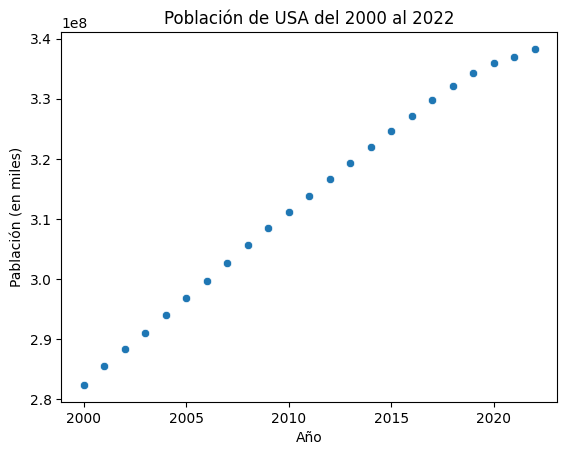

In [311]:
sns.scatterplot(data=PopulationUsa, x="Year", y="Population")

plt.title("Población de USA del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

In [282]:
# Extraer el año y la población de ArgDf
years = UsaDf['Year'].values.reshape(-1, 1)
population = UsaDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationUsa = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationUsa.round()

array([3.44570496e+08, 3.47208041e+08, 3.49845586e+08, 3.52483132e+08,
       3.55120677e+08, 3.57758222e+08, 3.60395768e+08, 3.63033313e+08,
       3.65670858e+08, 3.68308403e+08, 3.70945949e+08, 3.73583494e+08,
       3.76221039e+08, 3.78858584e+08, 3.81496130e+08, 3.84133675e+08,
       3.86771220e+08, 3.89408766e+08, 3.92046311e+08, 3.94683856e+08,
       3.97321401e+08, 3.99958947e+08, 4.02596492e+08, 4.05234037e+08,
       4.07871583e+08, 4.10509128e+08, 4.13146673e+08, 4.15784218e+08])

In [283]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población
data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationUsa.round()}

UsaTotal = pd.DataFrame(data)
UsaTotal['TDKcal'] = UsaTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
UsaTotal

,Year,Population,TDKcal
0,2023,344570496.0,2.515365e+14
1,2024,347208041.0,2.534619e+14
2,2025,349845586.0,2.553873e+14
3,2026,352483132.0,2.573127e+14
4,2027,355120677.0,2.592381e+14
5,2028,357758222.0,2.611635e+14
6,2029,360395768.0,2.630889e+14
7,2030,363033313.0,2.650143e+14
8,2031,365670858.0,2.669397e+14
9,2032,368308403.0,2.688651e+14


In [284]:
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = UsaDf[UsaDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

UsaDemandproduction = pd.DataFrame(data)
UsaDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,"Chillies and peppers, dry (Capsicum spp., Pime...",0,0,Agriculture
1,2000,Sesame seed,0,0,Oilcrops Primary
2,2000,Currants,0,0,Vegetables and Fruit Primary
3,2000,"Mangoes, guavas and mangosteens",1800000000,3000,Vegetables and Fruit Primary
4,2000,Taro,3561600000,3180,"Roots and Tubers, Total"
...,...,...,...,...,...
1624,2022,Tomatoes,1835955540000,10199753,Vegetables and Fruit Primary
1625,2022,Pineapples,8416123000000,16832246,Vegetables and Fruit Primary
1626,2022,Potatoes,14055553600000,17791840,"Roots and Tubers, Total"
1627,2022,Wheat,59271062400000,44902320,"Cereals, primary"


In [285]:
alt.Chart(UsaDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [286]:
data = []

for year in range(2023, 2051):
  target_kcal = UsaTotal[UsaTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(UsaDemandproduction) - 1)
    item = UsaDemandproduction.iloc[random_index]['Item']
    kcal = UsaDemandproduction.iloc[random_index]['TPKcal']

    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break
  data.append({'Year': year, 'Items': items})

result_df = pd.DataFrame(data)
result_df_transformed_Usa = result_df.explode('Items')
result_df_transformed_Usa['TPKcal'] = result_df_transformed_Usa.apply(lambda row: UsaDemandproduction[UsaDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Usa['Production'] = result_df_transformed_Usa.apply(lambda row: UsaDemandproduction[UsaDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Usa['Item Group'] = result_df_transformed_Usa.apply(lambda row: UsaDemandproduction[UsaDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Usa

,Year,Items,TPKcal,Production,Item Group
0,2023,"Beans, dry",1264168500000,1203970,Agriculture
0,2023,Wheat,80043976320000,60639376,"Cereals, primary"
0,2023,Lemons and limes,220991600000,762040,Vegetables and Fruit Primary
0,2023,Safflower seed,438307200000,128160,Oilcrops Primary
0,2023,Tomatoes,2272006980000,12622261,Vegetables and Fruit Primary
...,...,...,...,...,...
27,2050,Safflower seed,438307200000,128160,Oilcrops Primary
27,2050,Sunflower seed,9389143200000,1607730,Oilcrops Primary
27,2050,Rye,719973800000,213010,"Cereals, primary"
27,2050,Sweet potatoes,562545000000,625050,"Roots and Tubers, Total"


In [287]:
alt.Chart(result_df_transformed_Usa).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# Uruguay

In [288]:
UruDf = NewDf[NewDf['Country'] == 'Uruguay']
UruDf = UruDf[UruDf['Item Group'] != 'Sugar Crops Primary']
UruDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
974,858,Uruguay,2000,Vegetables and Fruit Primary,Cabbages,2700,25,5.80,1.28,0.10,3292224,156600000.0,34560000.0,2700000.0,675000000,2403323520000,240332352000,180249264000,80511337920
975,858,Uruguay,2000,Oilcrops Primary,Olives,3200,115,6.26,0.84,10.68,3292224,200320000.0,26880000.0,341760000.0,3680000000,2403323520000,240332352000,180249264000,80511337920
976,858,Uruguay,2000,Agriculture,"Beans, dry",3250,105,20.49,4.80,0.40,3292224,665925000.0,156000000.0,13000000.0,3412500000,2403323520000,240332352000,180249264000,80511337920
977,858,Uruguay,2000,Vegetables and Fruit Primary,Cantaloupes and other melons,3500,28,6.58,1.11,0.10,3292224,230300000.0,38850000.0,3500000.0,980000000,2403323520000,240332352000,180249264000,80511337920
978,858,Uruguay,2000,Vegetables and Fruit Primary,Green corn (maize),3500,360,18.70,3.27,1.35,3292224,654500000.0,114450000.0,47250000.0,12600000000,2403323520000,240332352000,180249264000,80511337920


In [289]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationUru = UruDf.groupby('Year',)['Population'].mean()
PopulationUru = pd.DataFrame(PopulationUru)
PopulationUru = PopulationUru.reset_index()
PopulationUru.columns = ['Year', 'Population']
PopulationUru

,Year,Population
0,2000,3292224.0
1,2001,3300939.0
2,2002,3306441.0
3,2003,3310202.0
4,2004,3313801.0
5,2005,3317665.0
6,2006,3322282.0
7,2007,3328651.0
8,2008,3336126.0
9,2009,3344156.0


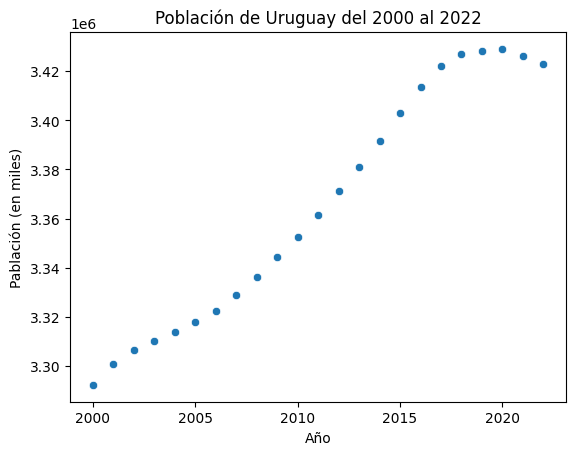

In [290]:
sns.scatterplot(data=PopulationUru, x="Year", y="Population")

plt.title("Población de Uruguay del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

In [291]:
# Extraer el año y la población de ArgDf
years = UruDf['Year'].values.reshape(-1, 1)
population = UruDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationUru = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationUru.round()

array([3450397., 3457485., 3464572., 3471659., 3478746., 3485833.,
       3492920., 3500007., 3507094., 3514181., 3521268., 3528355.,
       3535442., 3542529., 3549616., 3556703., 3563790., 3570877.,
       3577964., 3585051., 3592138., 3599225., 3606312., 3613399.,
       3620486., 3627573., 3634660., 3641747.])

In [292]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población
data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationUru.round()}

UruTotal = pd.DataFrame(data)
UruTotal['TDKcal'] = UruTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
UruTotal

,Year,Population,TDKcal
0,2023,3450397.0,2.518790e+12
1,2024,3457485.0,2.523964e+12
2,2025,3464572.0,2.529138e+12
3,2026,3471659.0,2.534311e+12
4,2027,3478746.0,2.539485e+12
5,2028,3485833.0,2.544658e+12
6,2029,3492920.0,2.549832e+12
7,2030,3500007.0,2.555005e+12
8,2031,3507094.0,2.560179e+12
9,2032,3514181.0,2.565352e+12


In [293]:
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = UruDf[UruDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

UruDemandproduction = pd.DataFrame(data)
UruDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,Cabbages,675000000,2700,Vegetables and Fruit Primary
1,2000,Olives,3680000000,3200,Oilcrops Primary
2,2000,"Beans, dry",3412500000,3250,Agriculture
3,2000,Cantaloupes and other melons,980000000,3500,Vegetables and Fruit Primary
4,2000,Green corn (maize),12600000000,3500,Vegetables and Fruit Primary
...,...,...,...,...,...
573,2022,Cantaloupes and other melons,66719520000,238284,Vegetables and Fruit Primary
574,2022,Maize (corn),957506400000,265974,"Cereals, primary"
575,2022,"Beans, dry",333212250000,317345,Agriculture
576,2022,Cabbages,95516250000,382065,Vegetables and Fruit Primary


In [294]:
alt.Chart(UruDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [295]:
data = []

for year in range(2023, 2051):
  target_kcal = UruTotal[UruTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(UruDemandproduction) - 1)
    item = UruDemandproduction.iloc[random_index]['Item']
    kcal = UruDemandproduction.iloc[random_index]['TPKcal']

    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break
  data.append({'Year': year, 'Items': items})

result_df = pd.DataFrame(data)
result_df_transformed_Uru = result_df.explode('Items')
result_df_transformed_Uru['TPKcal'] = result_df_transformed_Uru.apply(lambda row: UruDemandproduction[UruDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Uru['Production'] = result_df_transformed_Uru.apply(lambda row: UruDemandproduction[UruDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Uru['Item Group'] = result_df_transformed_Uru.apply(lambda row: UruDemandproduction[UruDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Uru

,Year,Items,TPKcal,Production,Item Group
0,2023,Barley,263097000000,213900,"Cereals, primary"
0,2023,Pomelos and grapefruits,2659620000,6999,Vegetables and Fruit Primary
0,2023,Green garlic,72084710000,48379,Vegetables and Fruit Primary
0,2023,"Onions and shallots, dry (excluding dehydrated)",69800000000,20000,Vegetables and Fruit Primary
0,2023,Pears,10906950000,19135,Vegetables and Fruit Primary
...,...,...,...,...,...
27,2050,"Pumpkins, squash and gourds",5200000000,20000,Vegetables and Fruit Primary
27,2050,Potatoes,85766350000,108565,"Roots and Tubers, Total"
27,2050,Peaches and nectarines,11764740000,30166,Vegetables and Fruit Primary
27,2050,Olives,3680000000,3200,Oilcrops Primary


In [296]:
alt.Chart(result_df_transformed_Uru).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# Venezuela

In [297]:
VenDf = NewDf[NewDf['Country'] == 'Venezuela (Bolivarian Republic of)']
VenDf = VenDf[VenDf['Item Group'] != 'Sugar Crops Primary']
VenDf.head()

,Code,Country,Year,Item Group,Item,Production,Kcal,Carb g.,Prot g.,Fat g.,Population,TPCarb,TPProt,TPFat,TPKcal,TDKcal,TDCarb,TDProt,TDFat
1006,862,Venezuela (Bolivarian Republic of),2000,Vegetables and Fruit Primary,Figs,0,74,19.18,0.75,0.30,24427729,0.0,0.0,0.0,0,17832242170000,1783224217000,1337418162750,597380112695
1007,862,Venezuela (Bolivarian Republic of),2000,Vegetables and Fruit Primary,"Onions and shallots, green",0,40,9.34,1.10,0.10,24427729,0.0,0.0,0.0,0,17832242170000,1783224217000,1337418162750,597380112695
1008,862,Venezuela (Bolivarian Republic of),2000,Vegetables and Fruit Primary,"Pumpkins, squash and gourds",0,26,6.50,1.00,0.10,24427729,0.0,0.0,0.0,0,17832242170000,1783224217000,1337418162750,597380112695
1009,862,Venezuela (Bolivarian Republic of),2000,Vegetables and Fruit Primary,Spinach,0,23,3.75,2.97,0.26,24427729,0.0,0.0,0.0,0,17832242170000,1783224217000,1337418162750,597380112695
1010,862,Venezuela (Bolivarian Republic of),2000,"Cereals, primary",Wheat,517,132,27.60,5.71,0.83,24427729,142692000.0,29520700.0,4291100.0,682440000,17832242170000,1783224217000,1337418162750,597380112695


In [298]:
# Mostrar la media de la pooblación del país en evaluación, considerando que la población no es modificada aunalmente
PopulationVen = VenDf.groupby('Year',)['Population'].mean()
PopulationVen = pd.DataFrame(PopulationVen)
PopulationVen = PopulationVen.reset_index()
PopulationVen.columns = ['Year', 'Population']
PopulationVen

,Year,Population
0,2000,24427729.0
1,2001,24880203.0
2,2002,25330929.0
3,2003,25782029.0
4,2004,26226927.0
5,2005,26668785.0
6,2006,27102081.0
7,2007,27525097.0
8,2008,27933833.0
9,2009,28327892.0


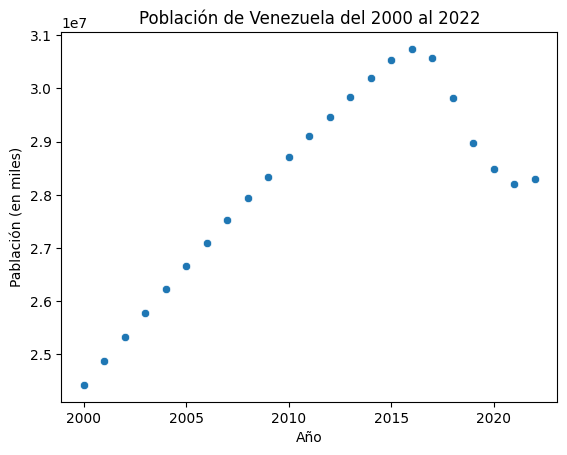

In [299]:
sns.scatterplot(data=PopulationVen, x="Year", y="Population")

plt.title("Población de Venezuela del 2000 al 2022")
plt.xlabel("Año")
plt.ylabel("Pablación (en miles)")

plt.show()

In [300]:
# Extraer el año y la población de ArgDf
years = VenDf['Year'].values.reshape(-1, 1)
population = VenDf['Population'].values

# Crear el modelo de regresión lineal y entrenar el modelo de datos
model = LinearRegression()
model.fit(years, population)

# Predecir la población de los años 2023 - 2050
predicted_populationVen = model.predict(np.arange(2023, 2051).reshape(-1, 1))
predicted_populationVen.round()

array([30734547., 30951041., 31167535., 31384028., 31600522., 31817015.,
       32033509., 32250003., 32466496., 32682990., 32899483., 33115977.,
       33332471., 33548964., 33765458., 33981951., 34198445., 34414939.,
       34631432., 34847926., 35064419., 35280913., 35497407., 35713900.,
       35930394., 36146887., 36363381., 36579875.])

In [301]:
# Crear un DataFrame a partir de los datos anteriores incluyendo el calculo de la demanda de Kcal estimadas para dicha población
data = {'Year': np.arange(2023, 2051),
        'Population': predicted_populationVen.round()}

VenTotal = pd.DataFrame(data)
VenTotal['TDKcal'] = VenTotal.apply(lambda row: (row['Population']* 2000 * 365), axis=1) # Demanda anual de Kcal según publación total
VenTotal

,Year,Population,TDKcal
0,2023,30734547.0,2.243622e+13
1,2024,30951041.0,2.259426e+13
2,2025,31167535.0,2.275230e+13
3,2026,31384028.0,2.291034e+13
4,2027,31600522.0,2.306838e+13
5,2028,31817015.0,2.322642e+13
6,2029,32033509.0,2.338446e+13
7,2030,32250003.0,2.354250e+13
8,2031,32466496.0,2.370054e+13
9,2032,32682990.0,2.385858e+13


In [302]:
data = {
    'Year': [],
    'Item': [],
    'TPKcal': [],
    'Production': [],
    'Item Group': []
}

for year in range(2000, 2023):
  country_df = VenDf[VenDf['Year'] == year]
  item_list = []
  total_kcal = 0
  for index, row in country_df.iterrows():
    if total_kcal < row['TDKcal']:
      item_list.append(row['Item'])
      total_kcal += row['TPKcal']
      data['Year'].append(year)
      data['Item'].append(row['Item'])
      data['TPKcal'].append(row['TPKcal'])
      data['Production'].append(row['Production'])
      data['Item Group'].append(row['Item Group'])
  item_list = []

VenDemandproduction = pd.DataFrame(data)
VenDemandproduction

,Year,Item,TPKcal,Production,Item Group
0,2000,Figs,0,0,Vegetables and Fruit Primary
1,2000,"Onions and shallots, green",0,0,Vegetables and Fruit Primary
2,2000,"Pumpkins, squash and gourds",0,0,Vegetables and Fruit Primary
3,2000,Spinach,0,0,Vegetables and Fruit Primary
4,2000,Wheat,682440000,517,"Cereals, primary"
...,...,...,...,...,...
959,2022,Cucumbers and gherkins,235554450000,1570363,Vegetables and Fruit Primary
960,2022,Eggplants (aubergines),410713500000,1642854,Vegetables and Fruit Primary
961,2022,"Coconuts, in shell",6304301040000,1780876,Oilcrops Primary
962,2022,Sweet potatoes,1812481200000,2013868,"Roots and Tubers, Total"


In [303]:
alt.Chart(VenDemandproduction).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

In [304]:
data = []

for year in range(2023, 2051):
  target_kcal = VenTotal[VenTotal['Year'] == year]['TDKcal'].values[0]
  items = []
  while True:
    random_index = random.randint(0, len(VenDemandproduction) - 1)
    item = VenDemandproduction.iloc[random_index]['Item']
    kcal = VenDemandproduction.iloc[random_index]['TPKcal']

    items.append(item)
    target_kcal -= kcal
    if target_kcal <= 0:
        break
  data.append({'Year': year, 'Items': items})

result_df = pd.DataFrame(data)
result_df_transformed_Ven = result_df.explode('Items')
result_df_transformed_Ven['TPKcal'] = result_df_transformed_Ven.apply(lambda row: VenDemandproduction[VenDemandproduction['Item'] == row['Items']]['TPKcal'].values[0], axis=1)
result_df_transformed_Ven['Production'] = result_df_transformed_Ven.apply(lambda row: VenDemandproduction[VenDemandproduction['Item'] == row['Items']]['Production'].values[0], axis=1)
result_df_transformed_Ven['Item Group'] = result_df_transformed_Ven.apply(lambda row: VenDemandproduction[VenDemandproduction['Item'] == row['Items']]['Item Group'].values[0], axis=1)
result_df_transformed_Ven

,Year,Items,TPKcal,Production,Item Group
0,2023,Green garlic,16860840000,11316,Vegetables and Fruit Primary
0,2023,Oil palm fruit,3294296720000,372658,Oilcrops Primary
0,2023,Maize (corn),6082383600000,1689551,"Cereals, primary"
0,2023,Figs,0,0,Vegetables and Fruit Primary
0,2023,Oil palm fruit,3294296720000,372658,Oilcrops Primary
...,...,...,...,...,...
27,2050,Yams,101577720000,87567,"Roots and Tubers, Total"
27,2050,Eggplants (aubergines),815750000,3263,Vegetables and Fruit Primary
27,2050,"Onions and shallots, dry (excluding dehydrated)",611545720000,175228,Vegetables and Fruit Primary
27,2050,Oil palm fruit,3294296720000,372658,Oilcrops Primary


In [305]:
alt.Chart(result_df_transformed_Ven).mark_bar().encode(
    alt.X("Year:O"),
    alt.Y("Production:Q"),
    color="Item Group",
    order="Item Group"
).properties(
    height=400,
    width=800
)

alt.Chart(...)

# Conclusiones

A continuación se muestra el resultado de las hipótesis planteadas:

1. Es posible auto-sustentar la demanda del consumo de alimentos de origen vegetal?
    R: Si, en un alto porcentaje los países análizados muestran un volumen de prducción que podría facilitar la demanda de una dieta balanceada para sus habitantes. Sin embargo, países como: Belie, Costa Rica, El Salvador, Guyana, Nicaragua, Panamá, Paraguay, Surinan y Uruguay; contemplan un bajo nuvel de volumen de producción, inferimos que en muchos de los casos debido a la extención de territorio para cultivo y las condiciones climáticas de los mismos. En otros casos debido al volumen de población esta demanda no puede verse cubierta, Ejemplo USA.En estos casos recomendamos politicas de comercio exterior con los países vecinos que faciliten la sustentabilidad alimentaria.

2. Es posible recomendar tipos de alimentos para optimizar el consumo nutricional de la población, basado en una dieta de 2000 Kcal diarias?

    R: Si, basada en la producción real de cada país desde 2000 - 2022 se enlista una alternativa de productos de alimentos de origen vegetal para cubrir la demanda de la población estimada para los próximos 30 años.

In [312]:
# Unificar las tablas de todos los resultados de estimación generados
result_df_transformed_Arg['Country'] = "Argentina"
result_df_transformed_Bel['Country'] = "Belize"
result_df_transformed_Bol['Country'] = "Bolivia"
result_df_transformed_Bra['Country'] = "Brazil"
result_df_transformed_Can['Country'] = "Canada"
result_df_transformed_Chi['Country'] = "Chile"
result_df_transformed_Col['Country'] = "Colombia"
result_df_transformed_CosR['Country'] = "Costa Rica"
result_df_transformed_Ecu['Country'] = "Ecuador"
result_df_transformed_Esa['Country'] = "El Salvador"
result_df_transformed_Gua['Country'] = "Guatemala"
result_df_transformed_Hon['Country'] = "Honduras"
result_df_transformed_Mex['Country'] = "Mexico"
result_df_transformed_Nic['Country'] = "Nicaragua"
result_df_transformed_Pan['Country'] = "Panama"
result_df_transformed_Par['Country'] = "Paraguay"
result_df_transformed_Per['Country'] = "Peru"
result_df_transformed_Sur['Country'] = "Suriname"
result_df_transformed_Usa['Country'] = "United States of America"
result_df_transformed_Uru['Country'] = "Uruguay"
result_df_transformed_Ven['Country'] = 'Venezuela (Bolivarian Republic of)'

merged_df = pd.concat([result_df_transformed_Arg,
                       result_df_transformed_Bel,
                       result_df_transformed_Bol,
                       result_df_transformed_Bra,
                       result_df_transformed_Can,
                       result_df_transformed_Chi,
                       result_df_transformed_Col,
                       result_df_transformed_CosR,
                       result_df_transformed_Ecu,
                       result_df_transformed_Esa,
                       result_df_transformed_Gua,
                       result_df_transformed_Hon,
                       result_df_transformed_Mex,
                       result_df_transformed_Nic,
                       result_df_transformed_Pan,
                       result_df_transformed_Par,
                       result_df_transformed_Per,
                       result_df_transformed_Sur,
                       result_df_transformed_Usa,
                       result_df_transformed_Uru])
merged_df

,Year,Items,TPKcal,Production,Item Group,Country
0,2023,Grapes,1648106200000,2459860,Vegetables and Fruit Primary,Argentina
0,2023,"Walnuts, in shell",5964591180000,912017,Agriculture,Argentina
0,2023,Rye,392603900000,116155,"Cereals, primary",Argentina
0,2023,Pears,292725780000,513554,Vegetables and Fruit Primary,Argentina
0,2023,Strawberries,281612480000,880039,Vegetables and Fruit Primary,Argentina
...,...,...,...,...,...,...
27,2050,"Pumpkins, squash and gourds",5200000000,20000,Vegetables and Fruit Primary,Uruguay
27,2050,Potatoes,85766350000,108565,"Roots and Tubers, Total",Uruguay
27,2050,Peaches and nectarines,11764740000,30166,Vegetables and Fruit Primary,Uruguay
27,2050,Olives,3680000000,3200,Oilcrops Primary,Uruguay


### Volumen de producción real acumulada por país entre 2000 - 2022

Text(0, 0.5, 'Production')

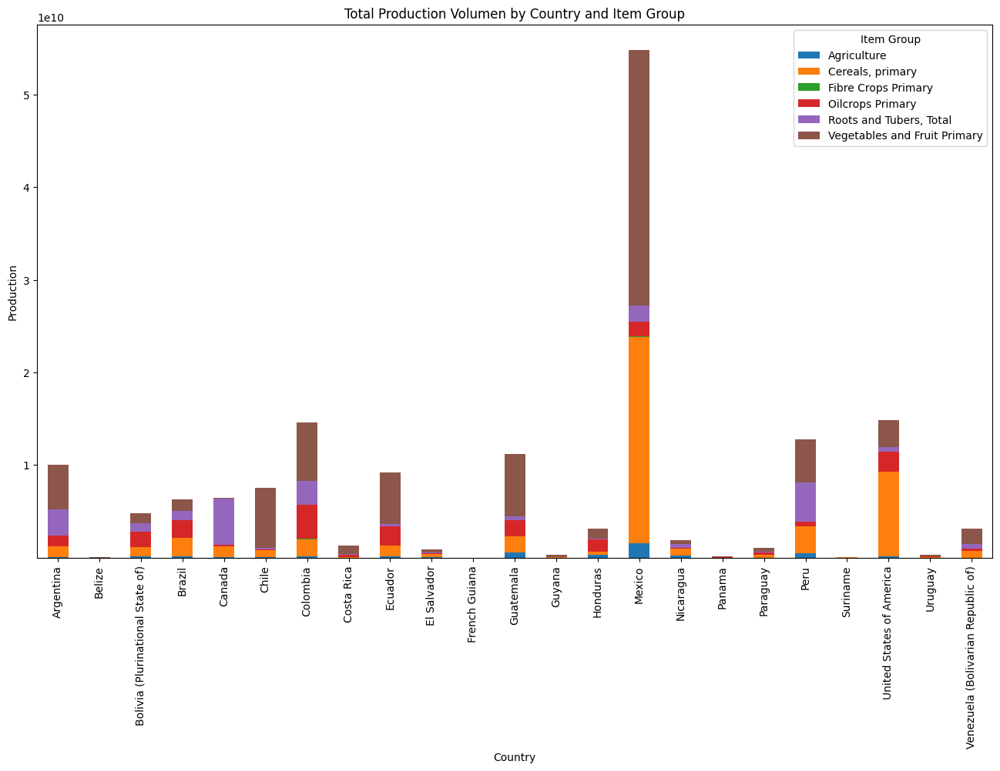

In [107]:
fig, ax = plt.subplots(figsize=(16, 9))
grouped_data = NewDf.groupby(['Country', 'Item Group'])['Production'].sum().unstack()

grouped_data.plot(kind='bar', stacked=True, ax=ax)

ax.set_title('Total Production Volumen by Country and Item Group')
ax.set_xlabel('Country')
ax.set_ylabel('Production')

### Volumen de producción estimada basada en la demanda de la población de 2023 - 2050

Text(0, 0.5, 'Production')

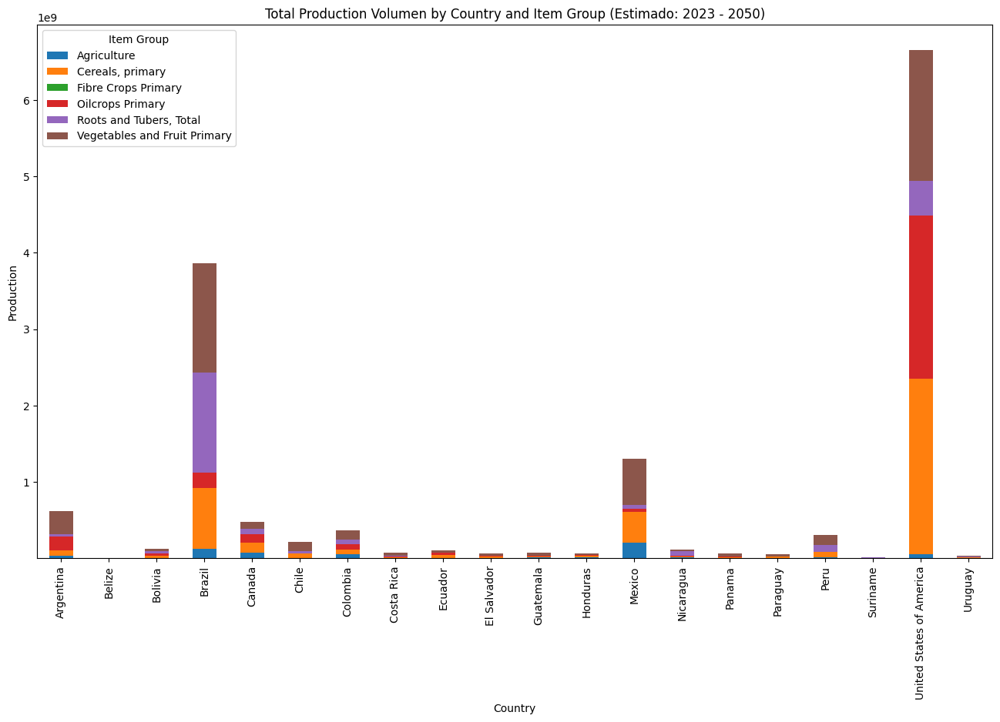

In [313]:
fig, ax = plt.subplots(figsize=(16, 9))
grouped_data = merged_df.groupby(['Country', 'Item Group'])['Production'].sum().unstack()

grouped_data.plot(kind='bar', stacked=True, ax=ax)

ax.set_title('Total Production Volumen by Country and Item Group (Estimado: 2023 - 2050)')
ax.set_xlabel('Country')
ax.set_ylabel('Production')